# Analysis of DRAGON networks for colorectal cancer Consensus Molecular Subtypes

In this notebook we are reproducing the colon cancer subtype results of the "Reproducible processing of TCGA regulatory
networks" paper.

After generating DRAGON networks for the four major consensus subtypes (CMS1 to CMS4) we proceed to analyze these
networks. We are interested in investigating whether complex multi-omics associations can explain the different
phenotypes of the four groups, and in particular the worse prognostics of CMS4.

First we are going to import some packages and define some functions. Go to section [Read the data](#read-the-data).

The utility functions are stored inside the `utils.py` file that is imported at the beginning of the notebook. 



#### Table of Content


- [Read the data](#read-the-data)
- [Load and clean the data](#load-and-clean-the-data)
- [DRAGON "TRANS": methylation to expression](#dragon-trans-methylation-to-expression)
- [Relationship between promoter methylation and TF expression](#relationship-between-promoter-methylation-and-tf-expression)
- [Clustering methylation to expression edges on different TFs](#clustering-methylation-to-expression-edges-on-different-tfs)
- [Analysis and visualization of the different clusters](#analysis-and-visualization-of-the-different-clusters)
- [Pathways for each cluster](pathways-for-each-cluster)

In [352]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import gseapy as gp
import networkx as nx
import os

# this is necessary only for better label positioning
!pip install adjustText

In [353]:
# import all functions from utils.py that is inside src folder
from src.utils import *

## Load and clean the data

Here we are using the dragon networks generated by the `tcga-data-nf` workflow, run with the `full` pipeline. 

The folder of the data is `batch-coad-subtype-20240510/` at ([myurl](myurl)).
You can download the results inside the `data/processed/`.

Configuration files used to generate the networks are inside the `conf/` folder. 

All results are gonna be stored inside the `results/dragon-post/` folder. However, the user can set any output folder
they want.

In [354]:
# Set output folder
output_folder = '../results/cms-post/'
# Check if folder exists
if os.path.exists(output_folder):
    print('Folder exists')
else:
    os.mkdir(output_folder)

Folder exists


In [355]:
# dictionary of file names for all dragons of interest
# This needs you to have downloaded the data from the storage

dragon_fn  = {'cms1':'../data/processed/batch-coad-subtype-20240510/tcga_coad_cms1/analysis/dragon/tcga_coad_cms1_dragon_mat.tsv',
             'cms2': '../data/processed/batch-coad-subtype-20240510/tcga_coad_cms2/analysis/dragon/tcga_coad_cms2_dragon_mat.tsv',
             'cms3': '../data/processed/batch-coad-subtype-20240510/tcga_coad_cms3/analysis/dragon/tcga_coad_cms3_dragon_mat.tsv',
             'cms4': '../data/processed/batch-coad-subtype-20240510/tcga_coad_cms4/analysis/dragon/tcga_coad_cms4_dragon_mat.tsv'}

In [356]:
# Read the dragons with the function from utils.py
dragons = read_dragons(dragon_fn)

cms1
cms2
cms3
cms4


In [357]:
# This is what a dragon looks like. 
# It is a dataframe with the TF name + modality names in the columns and rows.
# The matrix is symmetric

dragons['cms1'].head()

,AC023509.3_methylation,AC092835.1_methylation,AC138696.1_methylation,AEBP1_methylation,AEBP2_methylation,AHDC1_methylation,AIRE_methylation,AKAP8_methylation,AKAP8L_methylation,AKNA_methylation,...,ZNF84_expression,ZNF853_expression,ZNF860_expression,ZNF865_expression,ZNF880_expression,ZSCAN16_expression,ZSCAN22_expression,ZSCAN9_expression,ZXDB_expression,ZXDC_expression
AC023509.3_methylation,0.000000,0.010079,0.001609,-0.001914,0.002398,0.004454,-0.008123,0.000519,0.003486,0.002348,...,-0.001641,-0.007480,-0.002582,0.000422,-0.004480,0.003720,0.002558,0.003441,-0.001307,0.001628
AC092835.1_methylation,0.010079,0.000000,0.001370,0.008169,0.007796,0.005386,-0.016066,0.001738,0.001990,0.000933,...,-0.001513,-0.000493,0.001049,-0.005678,-0.001948,-0.002561,-0.002993,-0.005031,-0.003344,-0.000754
AC138696.1_methylation,0.001609,0.001370,0.000000,-0.003199,0.002904,0.007150,0.003810,0.009145,0.017653,-0.002921,...,0.001024,0.002031,-0.000580,-0.000158,0.000832,0.000678,-0.000269,-0.002647,-0.000910,-0.000314
AEBP1_methylation,-0.001914,0.008169,-0.003199,0.000000,0.000252,-0.000029,0.001248,-0.001056,-0.001047,0.002113,...,0.001842,-0.003248,0.000187,-0.001094,-0.002347,-0.000410,-0.003929,0.000282,0.001960,-0.000154
AEBP2_methylation,0.002398,0.007796,0.002904,0.000252,0.000000,-0.008129,0.002362,-0.002671,0.001363,-0.002856,...,-0.003264,0.001187,-0.001444,-0.001279,0.002488,0.002112,-0.005443,-0.000204,-0.000977,-0.006656


In [358]:
# we need to make sure the dragons are symmetric and that nothing went wrong
assert np.isclose(dragons['cms1'].values,dragons['cms1'].T.values).all()
assert np.isclose(dragons['cms2'].values,dragons['cms2'].T.values).all()
assert np.isclose(dragons['cms3'].values,dragons['cms3'].T.values).all()
assert np.isclose(dragons['cms4'].values,dragons['cms4'].T.values).all()

In [359]:
# For simplicity we write down the order of the subtypes
subtype_order = ['cms1', 'cms2', 'cms3', 'cms4']

In [360]:
# to keep track of all the edges we will create a dataframe where subtypes are in the columns and rows are the edges
dragon = get_long_dragon(dragons)
dragon.head()

                        level_0                 level_1         0
0        AC023509.3_methylation  AC092835.1_methylation  0.010079
1        AC023509.3_methylation  AC138696.1_methylation  0.001609
2        AC023509.3_methylation       AEBP1_methylation -0.001914
3        AC023509.3_methylation       AEBP2_methylation  0.002398
4        AC023509.3_methylation       AHDC1_methylation  0.004454
...                         ...                     ...       ...
1006066      ZSCAN22_expression         ZXDB_expression  0.000783
1006067      ZSCAN22_expression         ZXDC_expression  0.003939
1006068       ZSCAN9_expression         ZXDB_expression -0.000765
1006069       ZSCAN9_expression         ZXDC_expression  0.000768
1006070         ZXDB_expression         ZXDC_expression  0.000498

[1006071 rows x 3 columns]
                          node1                   node2      cms1
0        AC023509.3_methylation  AC092835.1_methylation  0.010079
1        AC023509.3_methylation  AC138696.1_meth

,node1,node2,cms1,cms2,cms3,cms4
0,AC023509.3_methylation,AC092835.1_methylation,0.010079,-0.002448,-0.012452,0.011108
1,AC023509.3_methylation,AC138696.1_methylation,0.001609,0.008164,0.006137,0.004494
2,AC023509.3_methylation,AEBP1_expression,-0.005313,0.002291,0.003407,-0.005202
3,AC023509.3_methylation,AEBP1_methylation,-0.001914,-0.004333,0.000148,0.002592
4,AC023509.3_methylation,AEBP2_expression,0.001178,0.001567,0.001819,0.001794


We generate a more detailed table with columns that describe average edge values, TF names...

In [361]:
# mean dragon value for all subtypes
dragon['mean']  = dragon.loc[:,subtype_order].mean(axis =1)
# absolute mean dragon value for all subtypes
dragon['abs_mean']  = np.abs(dragon.loc[:,subtype_order]).mean(axis =1)
# variance
dragon['var']  = dragon.loc[:,subtype_order].var(axis =1)

# node type, whether expression or methylation
dragon['node1_type'] = [i.split('_')[1] for i in dragon['node1']]
dragon['node2_type'] = [i.split('_')[1] for i in dragon['node2']]
# node name
dragon['node1_tf'] = [i.split('_')[0] for i in dragon['node1']]
dragon['node2_tf'] = [i.split('_')[0] for i in dragon['node2']]

# get absolute values for dragons
dragon.loc[:,[i+'_abs' for i in subtype_order]] = np.abs(dragon.loc[:,subtype_order].values)

# edge name
dragon['edge'] = dragon.node1_tf +'-'+ dragon.node2_tf
dragon = dragon.set_index('edge')
# select same TF edges
dragon['same'] = 1*(dragon.node1_tf == dragon.node2_tf)
dragon.sort_values(by = 'mean', ascending = False)

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,node2_type,node1_tf,node2_tf,cms1_abs,cms2_abs,cms3_abs,cms4_abs,same
edge,,,,,,,,,,,,,,,,,,
ZNF646-ZNF668,ZNF646_methylation,ZNF668_methylation,0.054987,0.066278,0.052999,0.066142,0.060101,0.060101,0.000050,methylation,methylation,ZNF646,ZNF668,0.054987,0.066278,0.052999,0.066142,0
HOXA5-HOXA6,HOXA5_methylation,HOXA6_methylation,0.023401,0.053203,0.041463,0.060362,0.044607,0.044607,0.000261,methylation,methylation,HOXA5,HOXA6,0.023401,0.053203,0.041463,0.060362,0
MECP2-ZNF674,MECP2_methylation,ZNF674_methylation,0.035878,0.047455,0.043566,0.043988,0.042722,0.042722,0.000024,methylation,methylation,MECP2,ZNF674,0.035878,0.047455,0.043566,0.043988,0
MECP2-ZNF41,MECP2_methylation,ZNF41_methylation,0.035997,0.047177,0.043406,0.044166,0.042686,0.042686,0.000023,methylation,methylation,MECP2,ZNF41,0.035997,0.047177,0.043406,0.044166,0
ZNF41-ZNF674,ZNF41_methylation,ZNF674_methylation,0.035610,0.047834,0.043143,0.044130,0.042679,0.042679,0.000026,methylation,methylation,ZNF41,ZNF674,0.035610,0.047834,0.043143,0.044130,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF256-ZNF256,ZNF256_methylation,ZNF256_expression,-0.010198,-0.040821,-0.018633,-0.040137,-0.027447,0.027447,0.000238,methylation,expression,ZNF256,ZNF256,0.010198,0.040821,0.018633,0.040137,1
ZNF264-ZNF264,ZNF264_methylation,ZNF264_expression,-0.016763,-0.036306,-0.020290,-0.037334,-0.027673,0.027673,0.000114,methylation,expression,ZNF264,ZNF264,0.016763,0.036306,0.020290,0.037334,1
ZNF582-ZNF582,ZNF582_methylation,ZNF582_expression,NaN,-0.029850,NaN,-0.027580,-0.028715,0.028715,0.000003,methylation,expression,ZNF582,ZNF582,NaN,0.029850,NaN,0.027580,1


We can calculate the average DRAGON edge for each edge type (homogeneous or heterogeneous) and for each subtype

In [362]:
# dragon means by edge type
dragon.groupby(by = ['node1_type', 'node2_type']).agg({i:'mean' for i in subtype_order})

cms1      cms2      cms3      cms4
node1_type  node2_type                                         
expression  expression   0.000240  0.000590  0.000197  0.000654
methylation expression   0.000052 -0.000025 -0.000005  0.000019
            methylation  0.000881  0.000996  0.000952  0.000981

We can also calculate the average **absolute** DRAGON edge for each edge type (homogeneous or heterogeneous) and for each subtype

In [363]:
# absolute values
subtype_abs = [i+'_abs' for i in subtype_order]
dragon.groupby(by = ['node1_type', 'node2_type']).agg({i:'mean' for i in subtype_abs})

cms1_abs  cms2_abs  cms3_abs  cms4_abs
node1_type  node2_type                                         
expression  expression   0.001412  0.003005  0.001233  0.003455
methylation expression   0.002148  0.003530  0.002269  0.003602
            methylation  0.004482  0.005870  0.005387  0.005282

## DRAGON "TRANS": methylation to expression 

Here we start looking into the methylation to expression edges (and viceversa).

- First we'll check the methylation to expression edges of the same node (TF1_methylation to TF1_expression)
- Secondly we'll check the methylation to expression edges of different nodes

In [364]:
# Get only methylation to expression edges
dragon_trans = dragon[(dragon.node1_type!=dragon.node2_type)]
dragon_trans.head()

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,node2_type,node1_tf,node2_tf,cms1_abs,cms2_abs,cms3_abs,cms4_abs,same
edge,,,,,,,,,,,,,,,,,,
AC023509.3-AEBP1,AC023509.3_methylation,AEBP1_expression,-0.005313,0.002291,0.003407,-0.005202,-0.001204,0.004053,2.211596e-05,methylation,expression,AC023509.3,AEBP1,0.005313,0.002291,0.003407,0.005202,0
AC023509.3-AEBP2,AC023509.3_methylation,AEBP2_expression,0.001178,0.001567,0.001819,0.001794,0.001590,0.001590,8.831465e-08,methylation,expression,AC023509.3,AEBP2,0.001178,0.001567,0.001819,0.001794,0
AC023509.3-AHDC1,AC023509.3_methylation,AHDC1_expression,-0.002381,-0.005991,-0.001529,-0.001857,-0.002939,0.002939,4.262913e-06,methylation,expression,AC023509.3,AHDC1,0.002381,0.005991,0.001529,0.001857,0
AC023509.3-AHR,AC023509.3_methylation,AHR_expression,NaN,NaN,-0.002166,NaN,-0.002166,0.002166,NaN,methylation,expression,AC023509.3,AHR,NaN,NaN,0.002166,NaN,0
AC023509.3-AKAP8L,AC023509.3_methylation,AKAP8L_expression,-0.001239,0.003665,-0.004399,0.005655,0.000921,0.003739,2.096827e-05,methylation,expression,AC023509.3,AKAP8L,0.001239,0.003665,0.004399,0.005655,0


In [365]:
# check that the number of edges is correct
dragon[(dragon.node2_type=='methylation') & (dragon.node1_type=='expression')].shape, dragon[(dragon.node1_type=='methylation') & (dragon.node2_type=='expression')].shape, dragon_trans.shape

((0, 18), (528452, 18), (528452, 18))

In [366]:
#dragon_trans['edge'] = dragon_trans.node1_tf +'-'+ dragon_trans.node2_tf
#dragon_trans = dragon_trans.set_index('edge')
#dragon_trans['same'] = 1*(dragon_trans.node1_tf == dragon_trans.node2_tf)

## Relationship between promoter methylation and TF expression

Here we check the methylation to expression edges on the same TF. 
According to literature, promoter methylation is often inhibiting expression, so we use these edges as controls.

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/2987542499.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_trans['same TF'] = (dragon_trans.node1_tf == dragon_trans.node2_tf)
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/2987542499.py:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[1][1].legend().remove()
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/2987542499.py:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[0][1].legend(

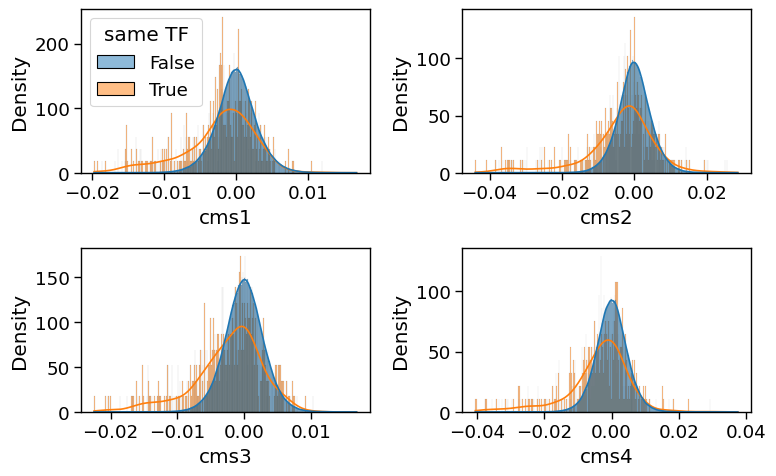

In [491]:
# Add binary label on whether the TFs are the same
sns.set_context('paper', font_scale = 1.5)
dragon_trans['same TF'] = (dragon_trans.node1_tf == dragon_trans.node2_tf)

f, ax = plt.subplots(2,2, figsize = (8,5))
sns.histplot(x = 'cms1', data = dragon_trans, hue = 'same TF', stat = 'density', common_norm  = False, kde = True, ax = ax[0][0])
sns.histplot(x = 'cms2', data = dragon_trans, hue = 'same TF', stat = 'density', common_norm  = False, kde = True, ax = ax[0][1])
sns.histplot(x = 'cms3', data = dragon_trans, hue = 'same TF', stat = 'density', common_norm  = False, kde = True, ax = ax[1][0])
sns.histplot(x = 'cms4', data = dragon_trans, hue = 'same TF', stat = 'density', common_norm  = False, kde = True, ax = ax[1][1])
plt.tight_layout()
ax[1][1].legend().remove()
ax[0][1].legend().remove()
ax[1][0].legend().remove()
plt.tight_layout()
f.savefig(output_folder+'dragon_sametf_values.pdf')

Caption: 
Distribution of partial correlation values between methylation and expression of TFs in all subtypes. In orange
 we show the values for the edges of the same TF, that is the correlation between the methylation of the promoter and
 the expression of the that same TF. As expected, on average methylation and expression are negatively correlated.
 The histogram represents the distribution density and it is normalized per subtype and per group.

 #### Is the pattern the same?
We now check if the above edges are correlated between different subtypes


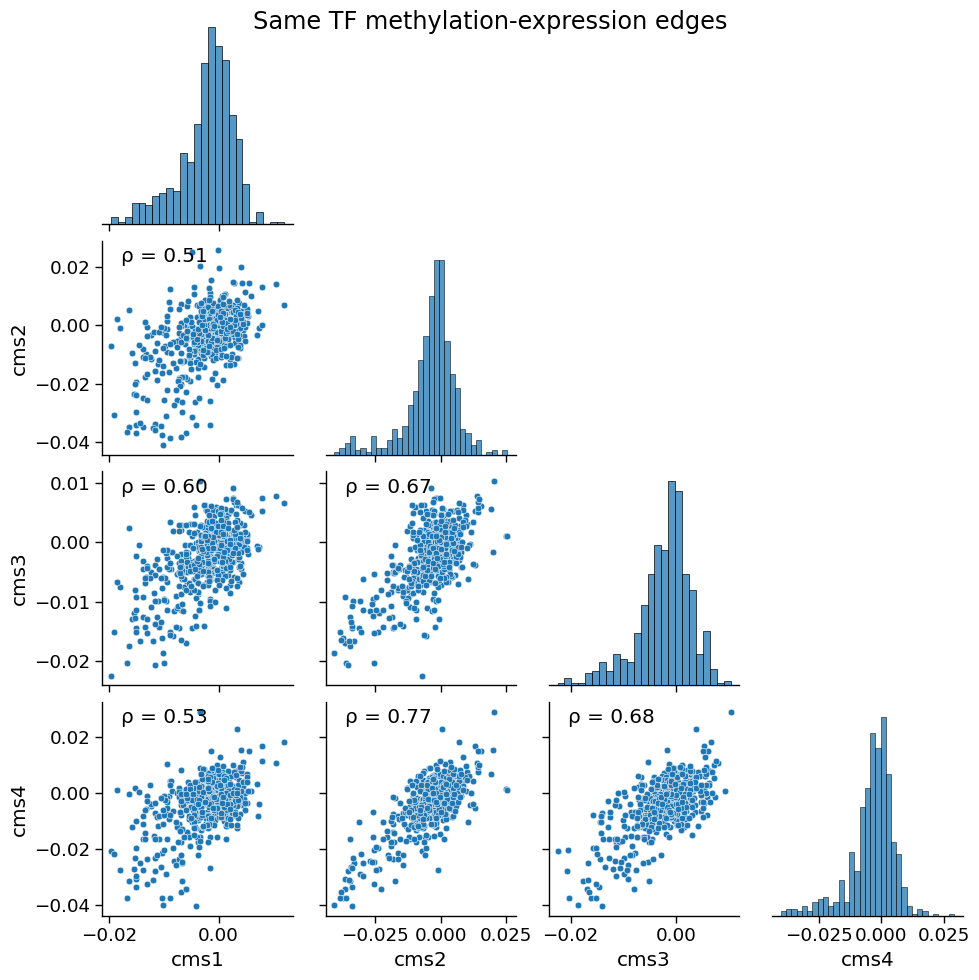

In [368]:
from scipy.stats import pearsonr, spearmanr
import matplotlib.pyplot as plt 

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    
    
g = sns.pairplot(data = dragon_trans[dragon_trans['same']==1].loc[:,subtype_order].dropna(axis =0), corner = True)

g.map_lower(corrfunc)
g.fig.suptitle('Same TF methylation-expression edges')
g.fig.savefig(output_folder+'dragon_same_tf_edges.pdf')
plt.show()


#### What are the strongest of these edges?

We select the top 10% of these edges for each subtype

In [369]:
th = 0.1 #quantile threshold

dragon_trans_same = dragon_trans[dragon_trans['same']==1].copy()

for key in subtype_order:
    threshold = dragon_trans_same[key].dropna().quantile(th)
    print(key, threshold)
    dragon_trans_same[key+'_lower'] = dragon_trans_same[key] < threshold
dragon_trans_same['lower'] = np.sum(dragon_trans_same.loc[:,[key+'_lower' for key in subtype_order]], axis = 1)
dragon_trans_same.sort_values(by = 'lower', ascending = True)

cms1 -0.009595682997884509
cms2 -0.01590839262254296
cms3 -0.00930463111024202
cms4 -0.01560371809056855


,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,cms2_abs,cms3_abs,cms4_abs,same,same tf,cms1_lower,cms2_lower,cms3_lower,cms4_lower,lower
edge,,,,,,,,,,,,,,,,,,,,,
AEBP1-AEBP1,AEBP1_methylation,AEBP1_expression,-0.002624,0.000903,-0.002126,0.000925,-0.000730,0.001645,0.000004,methylation,...,0.000903,0.002126,0.000925,1,True,False,False,False,False,0
TEF-TEF,TEF_methylation,TEF_expression,0.004885,-0.005492,0.005260,-0.003502,0.000288,0.004785,0.000031,methylation,...,0.005492,0.005260,0.003502,1,True,False,False,False,False,0
TERF2-TERF2,TERF2_methylation,TERF2_expression,0.003710,-0.003182,-0.004108,0.000892,-0.000672,0.002973,0.000013,methylation,...,0.003182,0.004108,0.000892,1,True,False,False,False,False,0
TET1-TET1,TET1_methylation,TET1_expression,NaN,-0.000144,NaN,0.003581,0.001719,0.001863,0.000007,methylation,...,0.000144,NaN,0.003581,1,True,False,False,False,False,0
TET3-TET3,TET3_methylation,TET3_expression,0.003196,0.003076,0.001740,0.006619,0.003658,0.003658,0.000004,methylation,...,0.003076,0.001740,0.006619,1,True,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TFAP2C-TFAP2C,TFAP2C_methylation,TFAP2C_expression,-0.009922,-0.025392,-0.020405,-0.020194,-0.018978,0.018978,0.000042,methylation,...,0.025392,0.020405,0.020194,1,True,True,True,True,True,4
L3MBTL4-L3MBTL4,L3MBTL4_methylation,L3MBTL4_expression,-0.013881,-0.034716,-0.012655,-0.016434,-0.019421,0.019421,0.000106,methylation,...,0.034716,0.012655,0.016434,1,True,True,True,True,True,4
BATF-BATF,BATF_methylation,BATF_expression,-0.015101,-0.033872,-0.014537,-0.033500,-0.024253,0.024253,0.000119,methylation,...,0.033872,0.014537,0.033500,1,True,True,True,True,True,4


<Axes: xlabel='lower', ylabel='Count'>

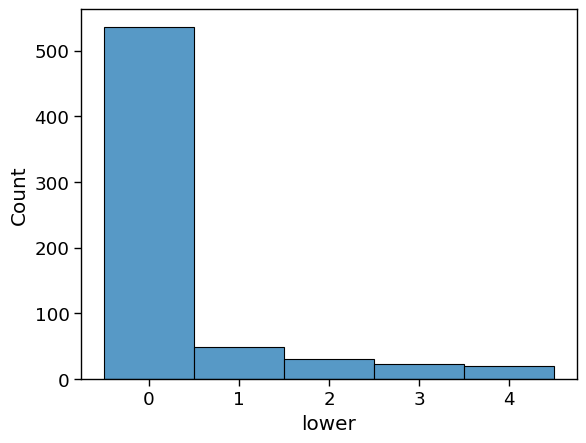

In [370]:
# How many TF are in the lower quantile for each subtype
sns.histplot(dragon_trans_same['lower'], bins = [0,1,2,3,4], discrete = True)

In [371]:
# Get the TF
dragon_trans_same['TF'] = dragon_trans_same.index.str.split('-').str[0].values

In [372]:
#Here are the TF that are consistenly lower in all subtypes, that is the correlation between methylation and expression
#is lower than the threshold for 10th percentile
silencing_tf = dragon_trans_same[(dragon_trans_same['lower']>0)]
silencing_tf

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,cms3_abs,cms4_abs,same,same tf,cms1_lower,cms2_lower,cms3_lower,cms4_lower,lower,TF
edge,,,,,,,,,,,,,,,,,,,,,
AEBP2-AEBP2,AEBP2_methylation,AEBP2_expression,-0.001224,-0.018277,-0.005222,-0.007302,-0.008006,0.008006,0.000053,methylation,...,0.005222,0.007302,1,True,False,True,False,False,1,AEBP2
ASCL2-ASCL2,ASCL2_methylation,ASCL2_expression,-0.012397,-0.011671,-0.010862,-0.004720,-0.009913,0.009913,0.000012,methylation,...,0.010862,0.004720,1,True,True,False,True,False,2,ASCL2
BATF-BATF,BATF_methylation,BATF_expression,-0.015101,-0.033872,-0.014537,-0.033500,-0.024253,0.024253,0.000119,methylation,...,0.014537,0.033500,1,True,True,True,True,True,4,BATF
CDX2-CDX2,CDX2_methylation,CDX2_expression,-0.012309,-0.003249,-0.005065,-0.003925,-0.006137,0.006137,0.000017,methylation,...,0.005065,0.003925,1,True,True,False,False,False,1,CDX2
CENPBD1-CENPBD1,CENPBD1_methylation,CENPBD1_expression,-0.007592,-0.025666,-0.005266,-0.024632,-0.015789,0.015789,0.000118,methylation,...,0.005266,0.024632,1,True,False,True,False,True,2,CENPBD1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF790-ZNF790,ZNF790_methylation,ZNF790_expression,-0.006618,-0.026349,-0.010402,-0.024789,-0.017040,0.017040,0.000100,methylation,...,0.010402,0.024789,1,True,False,True,True,True,3,ZNF790
ZNF830-ZNF830,ZNF830_methylation,ZNF830_expression,-0.013133,-0.016538,-0.004363,-0.023526,-0.014390,0.014390,0.000063,methylation,...,0.004363,0.023526,1,True,True,True,False,True,3,ZNF830
ZNF853-ZNF853,ZNF853_methylation,ZNF853_expression,0.001354,-0.010320,-0.011164,-0.016328,-0.009115,0.009792,0.000056,methylation,...,0.011164,0.016328,1,True,False,False,True,True,2,ZNF853


There are 120 TFs that are "silenced" by methylation in at least one subtype

[Text(0.5, 0, 'MTERF1'),
 Text(1.5, 0, 'HOXB8'),
 Text(2.5, 0, 'ZNF256'),
 Text(3.5, 0, 'ZNF14'),
 Text(4.5, 0, 'ZNF28'),
 Text(5.5, 0, 'ZFP3'),
 Text(6.5, 0, 'ZNF329'),
 Text(7.5, 0, 'TFAP2C'),
 Text(8.5, 0, 'STAT5A'),
 Text(9.5, 0, 'ZNF345'),
 Text(10.5, 0, 'ZNF347'),
 Text(11.5, 0, 'ZNF501'),
 Text(12.5, 0, 'ZNF512'),
 Text(13.5, 0, 'L3MBTL4'),
 Text(14.5, 0, 'ZNF570'),
 Text(15.5, 0, 'ZNF264'),
 Text(16.5, 0, 'BATF'),
 Text(17.5, 0, 'GRHL3'),
 Text(18.5, 0, 'ZNF785'),
 Text(19.5, 0, 'ZNF790'),
 Text(20.5, 0, 'PAX8'),
 Text(21.5, 0, 'ZNF354C'),
 Text(22.5, 0, 'ZNF304'),
 Text(23.5, 0, 'CREB3L1'),
 Text(24.5, 0, 'ZFP82'),
 Text(25.5, 0, 'ZNF880'),
 Text(26.5, 0, 'ZNF518B'),
 Text(27.5, 0, 'ZNF215'),
 Text(28.5, 0, 'ZNF532'),
 Text(29.5, 0, 'IRF8'),
 Text(30.5, 0, 'HMGA1'),
 Text(31.5, 0, 'ZNF280B'),
 Text(32.5, 0, 'ZNF22'),
 Text(33.5, 0, 'ZNF24'),
 Text(34.5, 0, 'HOXA10'),
 Text(35.5, 0, 'HOXB4'),
 Text(36.5, 0, 'HOXB2'),
 Text(37.5, 0, 'TBX18'),
 Text(38.5, 0, 'ZNF830'),
 Text(39.5

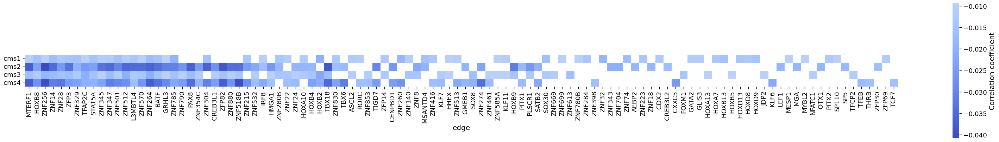

In [373]:
data = silencing_tf.dropna(axis = 0).sort_values('lower', ascending = False)
f, ax = plt.subplots(figsize = (40,5))
sns.heatmap(data.loc[:,subtype_order].T, cmap = 'coolwarm', center = 0, cbar_kws={'label': 'Correlation coefficient'}, mask = data.loc[:,['cms1_lower','cms2_lower','cms3_lower','cms4_lower']].T.values==0, ax = ax, xticklabels=1, square = True)
ax.set_xticklabels(data.index.str.split('-').str[0].values)




### Annotate these genes to known datasets

In [374]:
oncokb = pd.read_csv('../data/external/oncokb_20221213.tsv', sep = '\t')
oncokb

,Hugo Symbol,Entrez Gene ID,GRCh37 Isoform,GRCh37 RefSeq,GRCh38 Isoform,GRCh38 RefSeq,# of occurrence within resources (Column D-J),OncoKB Annotated,Is Oncogene,Is Tumor Suppressor Gene,MSK-IMPACT,MSK-HEME,FOUNDATION ONE,FOUNDATION ONE HEME,Vogelstein,SANGER CGC(05/30/2017),Gene Aliases
0,ABL1,25,ENST00000318560,NM_005157.4,ENST00000318560,NM_005157.4,7,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,"ABL, JTK7, c-ABL"
1,AKT1,207,ENST00000349310,NM_001014431.1,ENST00000349310,NM_001014431.1,7,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,"AKT, PKB, PRKBA, RAC, RAC-alpha"
2,ALK,238,ENST00000389048,NM_004304.4,ENST00000389048,NM_004304.4,7,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,CD246
3,AMER1,139285,ENST00000330258,NM_152424.3,ENST00000374869,NM_152424.3,7,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,"FAM123B, FLJ39827, RP11-403E24.2, WTX"
4,APC,324,ENST00000257430,NM_000038.5,ENST00000257430,NM_000038.5,7,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,"DP2.5, PPP1R46"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1079,ZFP36L2,678,ENST00000282388,NM_006887.4,ENST00000282388,NM_006887.4,1,Yes,No,Yes,No,No,No,No,No,No,"ERF2, RNF162C, TIS11D"
1080,ZMYM3,9203,NaN,NaN,NaN,NaN,1,No,No,No,No,No,No,Yes,No,No,"DXS6673E, KIAA0385, ZNF198L2, ZNF261"
1081,ZNF24,7572,NaN,NaN,NaN,NaN,1,No,No,No,No,No,No,Yes,No,No,"KOX17, ZNF191, ZSCAN3, Zfp191"
1082,ZNF331,55422,NaN,NaN,NaN,NaN,1,No,No,No,No,No,No,No,No,Yes,"RITA, ZNF361, ZNF463"


In [375]:
# Check with disgenet
disgenet_colorectal = pd.read_csv("../data/external/DISEASES_Summary_GDA_CURATED_C0009404.tsv", sep = '\t')
disgenet_colorectal

,DOClass,Disease,DiseaseClass,EvidenceIndexGDA,EvidenceLevelGDA,FirstRef,Gene,GeneDPI,GeneDSI,GeneFullName,...,SemanticType,Type,UnitProt,diseaseUMLSCUI,geneEnsemblIDs,geneNcbiID,geneNcbiType,numCTs,numChemsIncludedInEvidences,numPMIDSWithChemsIncludedInEvidences
0,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",0.927126,NaN,2004.0,TYMS,0.92,0.41,thymidylate synthetase,...,Neoplastic Process (T191),disease,"Q53Y97,P04818",C0009404,ENSG00000176890,7298,protein-coding,3,32,143
1,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",0.923923,NaN,2008.0,BRAF,0.92,0.29,"B-Raf proto-oncogene, serine/threonine kinase",...,Neoplastic Process (T191),disease,P15056,C0009404,ENSG00000157764,673,protein-coding,80,87,162
2,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",0.897666,NaN,2003.0,TP53,0.88,0.26,tumor protein p53,...,Neoplastic Process (T191),disease,"A0A087X1Q1,A0A087WT22,Q53GA5,P04637,H2EHT1,K7P...",C0009404,ENSG00000141510,7157,protein-coding,7,41,51
3,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",0.929936,NaN,2003.0,APC,0.88,0.37,APC regulator of WNT signaling pathway,...,Neoplastic Process (T191),disease,"Q4LE70,P25054",C0009404,ENSG00000134982,324,protein-coding,3,38,36
4,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",0.947368,NaN,2004.0,DPYD,0.88,0.45,dihydropyrimidine dehydrogenase,...,Neoplastic Process (T191),disease,Q12882,C0009404,ENSG00000188641,1806,protein-coding,4,19,70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",1.000000,NaN,2012.0,ABCB10,0.46,0.73,ATP binding cassette subfamily B member 10,...,Neoplastic Process (T191),disease,Q9NRK6,C0009404,ENSG00000135776,23456,protein-coding,0,0,0
359,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",1.000000,NaN,2015.0,CBX5,0.75,0.57,chromobox 5,...,Neoplastic Process (T191),disease,"P45973,V9HWG0",C0009404,ENSG00000094916,23468,protein-coding,0,0,0
360,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",1.000000,NaN,2014.0,FADS1,0.88,0.53,fatty acid desaturase 1,...,Neoplastic Process (T191),disease,"O60427,A0A0A0MR51",C0009404,ENSG00000149485,3992,protein-coding,0,0,0
361,"disease of anatomical entity (7),disease of ce...",Colorectal Neoplasms,"Neoplasms,Digestive System Diseases",1.000000,NaN,2012.0,ABCB6,0.71,0.60,ATP binding cassette subfamily B member 6 (LAN...,...,Neoplastic Process (T191),disease,Q9NP58,C0009404,ENSG00000115657,10058,protein-coding,0,0,0


In [376]:
dragon_trans_same['is_disgenet'] = 1*(dragon_trans_same['TF'].isin(disgenet_colorectal['Gene']))
dragon_trans_same[dragon_trans_same['is_disgenet']==1]

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,cms4_abs,same,same tf,cms1_lower,cms2_lower,cms3_lower,cms4_lower,lower,TF,is_disgenet
edge,,,,,,,,,,,,,,,,,,,,,
DOT1L-DOT1L,DOT1L_methylation,DOT1L_expression,0.003950,0.003170,-0.000116,-0.000769,0.001559,0.002001,0.000006,methylation,...,0.000769,1,True,False,False,False,False,0,DOT1L,1
ETV1-ETV1,ETV1_methylation,ETV1_expression,-0.009446,-0.009014,-0.006627,-0.001803,-0.006722,0.006722,0.000012,methylation,...,0.001803,1,True,False,False,False,False,0,ETV1,1
HOXD9-HOXD9,HOXD9_methylation,HOXD9_expression,-0.014497,-0.006883,-0.000531,0.000276,-0.005409,0.005547,0.000047,methylation,...,0.000276,1,True,True,False,False,False,1,HOXD9,1
KDM2A-KDM2A,KDM2A_methylation,KDM2A_expression,-0.005541,0.001515,-0.002686,0.001367,-0.001336,0.002777,0.000012,methylation,...,0.001367,1,True,False,False,False,False,0,KDM2A,1
KLF5-KLF5,KLF5_methylation,KLF5_expression,0.000111,0.000408,-0.005076,-0.002779,-0.001834,0.002094,0.000007,methylation,...,0.002779,1,True,False,False,False,False,0,KLF5,1
MAF-MAF,MAF_methylation,MAF_expression,-0.001441,-0.000431,-0.003169,-0.005648,-0.002672,0.002672,0.000005,methylation,...,0.005648,1,True,False,False,False,False,0,MAF,1
MYC-MYC,MYC_methylation,MYC_expression,NaN,NaN,0.000495,NaN,0.000495,0.000495,NaN,methylation,...,NaN,1,True,False,False,False,False,0,MYC,1
NME2-NME2,NME2_methylation,NME2_expression,0.000695,-0.003536,-0.004993,-0.008104,-0.003984,0.004332,0.000013,methylation,...,0.008104,1,True,False,False,False,False,0,NME2,1
NR4A2-NR4A2,NR4A2_methylation,NR4A2_expression,-0.003008,-0.002820,0.002543,-0.004502,-0.001947,0.003218,0.000010,methylation,...,0.004502,1,True,False,False,False,False,0,NR4A2,1


In [377]:
# Cancer gene census
cgc = pd.read_csv('../data/external/Census_allFri Apr 25 20_35_35 2025.csv')
cgc

,Gene Symbol,Name,Entrez GeneId,Genome Location,Tier,Hallmark,Chr Band,Somatic,Germline,Tumour Types(Somatic),Tumour Types(Germline),Cancer Syndrome,Tissue Type,Molecular Genetics,Role in Cancer,Mutation Types,Translocation Partner,Other Germline Mut,Other Syndrome,Synonyms
0,A1CF,APOBEC1 complementation factor,29974.0,10:50799421-50885675,2,NaN,10q11.23,yes,NaN,melanoma,NaN,NaN,E,NaN,oncogene,Mis,NaN,NaN,NaN,"ACF,ACF64,ACF65,APOBEC1CF,ASP,CCDS73133.1,ENSG..."
1,ABI1,abl-interactor 1,10006.0,10:26746593-26860935,1,Yes,10p12.1,yes,NaN,AML,NaN,NaN,L,Dom,"TSG, fusion",T,KMT2A,NaN,NaN,"ABI-1,CCDS7150.1,E3B1,ENSG00000136754.17,NM_00..."
2,ABL1,v-abl Abelson murine leukemia viral oncogene h...,25.0,9:130713946-130885683,1,Yes,9q34.12,yes,NaN,"CML, ALL, T-ALL",NaN,NaN,L,Dom,"oncogene, fusion","T, Mis","BCR, ETV6, NUP214",NaN,NaN,"ABL,CCDS35165.1,ENSG00000097007.17,JTK7,NM_007..."
3,ABL2,"c-abl oncogene 2, non-receptor tyrosine kinase",27.0,1:179099327-179229601,1,NaN,1q25.2,yes,NaN,AML,NaN,NaN,L,Dom,"oncogene, fusion",T,ETV6,NaN,NaN,"ABLL,ARG,CCDS30947.1,ENSG00000143322.19,NM_007..."
4,ACKR3,atypical chemokine receptor 3,57007.0,2:236569641-236582358,1,Yes,2q37.3,yes,NaN,lipoma,NaN,NaN,M,Dom,"oncogene, fusion",T,HMGA2,NaN,NaN,"CCDS2516.1,CMKOR1,CXCR7,ENSG00000144476.5,GPR1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
748,ZNF429,zinc finger protein 429,353088.0,19:21505564-21538078,2,NaN,19p12,yes,NaN,GBM,NaN,NaN,O,NaN,NaN,Mis,NaN,NaN,NaN,"CCDS42537.1,ENSG00000197013.9,NM_001001415.2,N..."
749,ZNF479,zinc finger protein 479,90827.0,7:57119614-57139864,2,NaN,7p11.2,yes,NaN,"lung cancer, bladder carcinoma, prostate carci...",NaN,NaN,E,NaN,NaN,Mis,NaN,NaN,NaN,"CCDS43590.1,ENSG00000185177.12,KR19,NM_033273...."
750,ZNF521,zinc finger protein 521,25925.0,18:25061926-25352152,1,NaN,18q11.2,yes,NaN,ALL,NaN,NaN,L,Dom,"oncogene, fusion",T,PAX5,NaN,NaN,"CCDS32806.1,EHZF,ENSG00000198795.10,Evi3,NM_01..."
751,ZNRF3,zinc and ring finger 3,84133.0,22:28883592-29057487,2,NaN,22q12.1,yes,NaN,"colorectal cancer, adrenocortical carcinoma, g...",NaN,NaN,E,NaN,TSG,"N, F, Mis",NaN,NaN,NaN,"BK747E2.3,CCDS56225.1,ENSG00000183579.15,FLJ22..."


In [378]:
colon_cgc = cgc[cgc['Tumour Types(Somatic)'].fillna(" ").str.lower().str.contains('colon|colorectal')]
all_drivers = cgc['Gene Symbol'].unique()
colon_drivers = colon_cgc['Gene Symbol'].unique()

In [379]:
dragon_trans_same['is_driver'] = 1*(dragon_trans_same['TF'].isin(all_drivers))
dragon_trans_same['is_colon_driver'] = 1*(dragon_trans_same['TF'].isin(colon_drivers))

dragon_trans_same[dragon_trans_same['is_colon_driver']==1]

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,same tf,cms1_lower,cms2_lower,cms3_lower,cms4_lower,lower,TF,is_disgenet,is_driver,is_colon_driver
edge,,,,,,,,,,,,,,,,,,,,,
CUX1-CUX1,CUX1_methylation,CUX1_expression,-0.000345,-0.004558,-0.002505,-0.003872,-0.002820,0.002820,0.000003,methylation,...,True,False,False,False,False,0,CUX1,0,1,1
HIF1A-HIF1A,HIF1A_methylation,HIF1A_expression,-0.000566,-0.010536,0.000795,-0.003477,-0.003446,0.003844,0.000026,methylation,...,True,False,False,False,False,0,HIF1A,0,1,1
IKZF3-IKZF3,IKZF3_methylation,IKZF3_expression,-0.001805,-0.008602,-0.003366,-0.012183,-0.006489,0.006489,0.000023,methylation,...,True,False,False,False,False,0,IKZF3,0,1,1
SMAD4-SMAD4,SMAD4_methylation,SMAD4_expression,0.002400,-0.009859,-0.003258,-0.003150,-0.003467,0.004667,0.000025,methylation,...,True,False,False,False,False,0,SMAD4,1,1,1
TP53-TP53,TP53_methylation,TP53_expression,0.000899,-0.002305,0.003481,0.001333,0.000852,0.002004,0.000006,methylation,...,True,False,False,False,False,0,TP53,1,1,1


In [380]:
dragon_trans_same_oncokb = dragon_trans_same.merge(oncokb, left_on = 'TF', right_on = 'Hugo Symbol', how = 'left')
dragon_trans_same_oncokb['in_oncokb'] = 1*(dragon_trans_same_oncokb['# of occurrence within resources (Column D-J)'].notna())

In [381]:
silencing_tf = dragon_trans_same_oncokb[(dragon_trans_same_oncokb['lower']>0)]
for i in oncokb.columns[7:-1]:
    silencing_tf[i] = silencing_tf[i].map({'Yes':1, 'No':0}).fillna(0)
silencing_tf

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1778636711.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  silencing_tf[i] = silencing_tf[i].map({'Yes':1, 'No':0}).fillna(0)
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1778636711.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  silencing_tf[i] = silencing_tf[i].map({'Yes':1, 'No':0}).fillna(0)
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1778636711.py:3: SettingWithCopyWarning: 
A value is tryi

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,Is Oncogene,Is Tumor Suppressor Gene,MSK-IMPACT,MSK-HEME,FOUNDATION ONE,FOUNDATION ONE HEME,Vogelstein,SANGER CGC(05/30/2017),Gene Aliases,in_oncokb
1,AEBP2_methylation,AEBP2_expression,-0.001224,-0.018277,-0.005222,-0.007302,-0.008006,0.008006,0.000053,methylation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0
12,ASCL2_methylation,ASCL2_expression,-0.012397,-0.011671,-0.010862,-0.004720,-0.009913,0.009913,0.000012,methylation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0
22,BATF_methylation,BATF_expression,-0.015101,-0.033872,-0.014537,-0.033500,-0.024253,0.024253,0.000119,methylation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0
39,CDX2_methylation,CDX2_expression,-0.012309,-0.003249,-0.005065,-0.003925,-0.006137,0.006137,0.000017,methylation,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,CDX3,1
43,CENPBD1_methylation,CENPBD1_expression,-0.007592,-0.025666,-0.005266,-0.024632,-0.015789,0.015789,0.000118,methylation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
636,ZNF790_methylation,ZNF790_expression,-0.006618,-0.026349,-0.010402,-0.024789,-0.017040,0.017040,0.000100,methylation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0
643,ZNF830_methylation,ZNF830_expression,-0.013133,-0.016538,-0.004363,-0.023526,-0.014390,0.014390,0.000063,methylation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0
646,ZNF853_methylation,ZNF853_expression,0.001354,-0.010320,-0.011164,-0.016328,-0.009115,0.009792,0.000056,methylation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0
649,ZNF880_methylation,ZNF880_expression,-0.001542,-0.033981,-0.010682,-0.026928,-0.018283,0.018283,0.000220,methylation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0


In [382]:
annotation_map = {'is_disgenet':'disgenet', 'is_driver':'CGC', 'is_colon_driver':'CGC (colon only)', 'in_oncokb':'Any OncoKB'}

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/3236813002.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


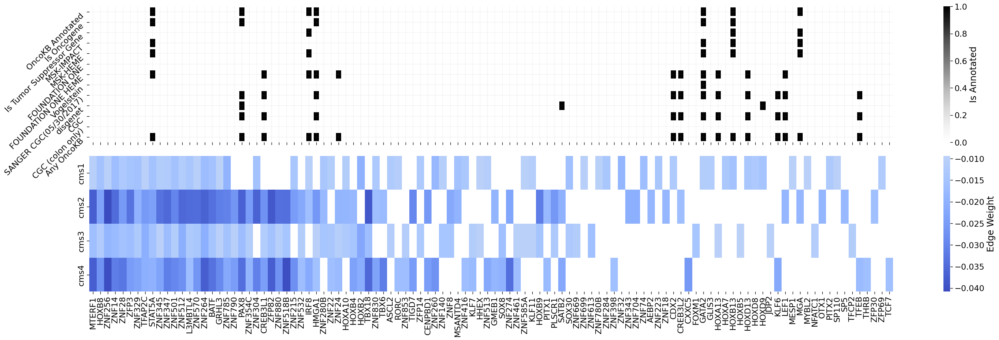

In [ ]:
sns.set_context('paper', font_scale = 1.8)
data = silencing_tf[silencing_tf['lower']>0].dropna(subset = subtype_order, axis = 0).sort_values('lower', ascending = False)
f, ax = plt.subplots(2,1,figsize = (35,10), gridspec_kw={'hspace': 0.1})
sns.heatmap(data.loc[:,subtype_order].T, cmap = 'coolwarm', center = 0, cbar_kws={'label': 'Edge Weight'}, mask = data.loc[:,['cms1_lower','cms2_lower','cms3_lower','cms4_lower']].T.values==0, ax = ax[1], xticklabels=1)
ax[1].set_xticklabels(data.TF.str.split('-').str[0].values, rotation = 90)

annotations = oncokb.columns[7:-1].tolist() + ['is_disgenet', 'is_driver', 'is_colon_driver', 'in_oncokb']
sns.heatmap(data.loc[:,annotations].T, cmap = 'Greys', cbar_kws={'label': 'Is Annotated'}, ax = ax[0], xticklabels=1, lw = 4, linecolor = 'white')
ax[0].set_yticklabels([annotation_map[i.get_text()] if i.get_text() in annotation_map.keys() else i.get_text() for i in ax[0].get_yticklabels()], rotation = 45, ha = 'right', va = 'top')
# move xticks to the right
ax[0].set_xticklabels("")
ax[0].grid(True, axis = 'both', color = 'grey', lw = .1)
plt.tight_layout()
f.savefig(output_folder+'dragon_silencing_tf.pdf', bbox_inches='tight')

### Test if the distribution is different

is_driver cms1 0.08122383252818036 0.36952683063103753
is_driver cms2 0.06907139023081052 0.48319043559169733
is_driver cms4 0.13135802469135802 0.07825087338333235
is_colon_driver cms2 0.5314900153609831 0.03891083597717208
is_colon_driver cms4 0.3775729646697389 0.18991024237432141
is_disgenet cms1 0.1541931326521219 0.41203876630126013
is_disgenet cms2 0.1643192488262911 0.3679357718316441
is_disgenet cms4 0.19939243302954984 0.23540951073312585
in_oncokb cms1 0.06298773690078038 0.4771343196517147
in_oncokb cms3 0.0632664437012263 0.4740965355463415
in_oncokb cms4 0.09085841694537347 0.220744819362017


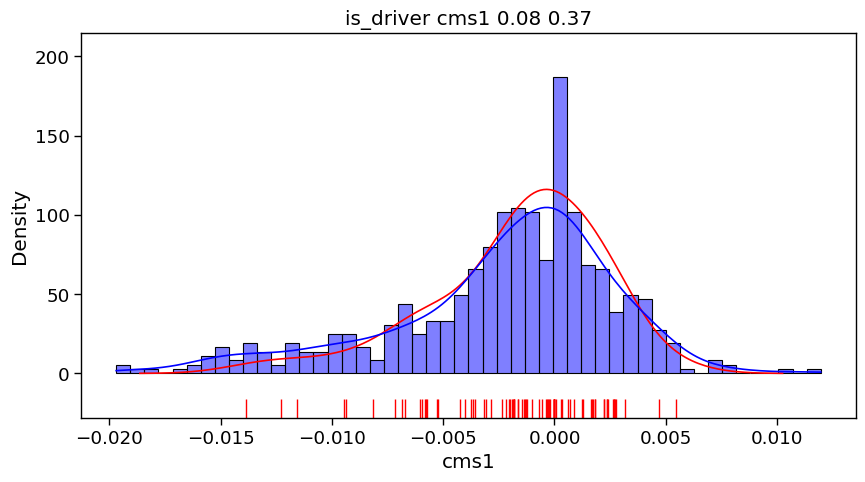

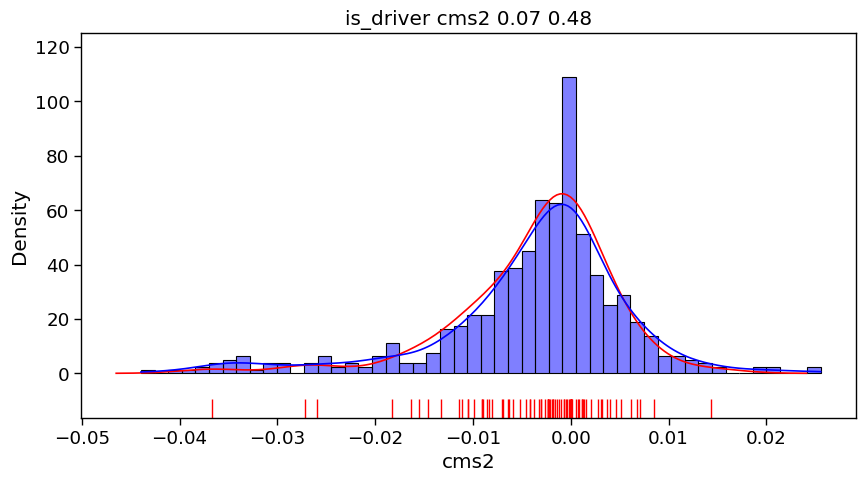

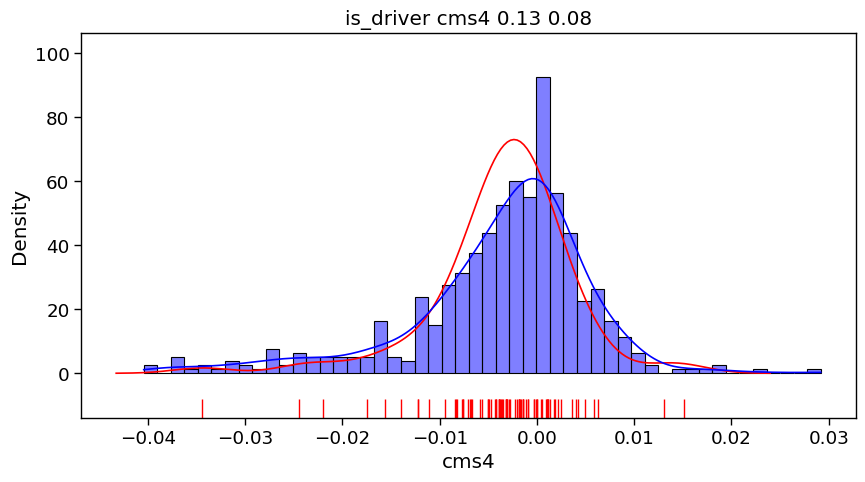

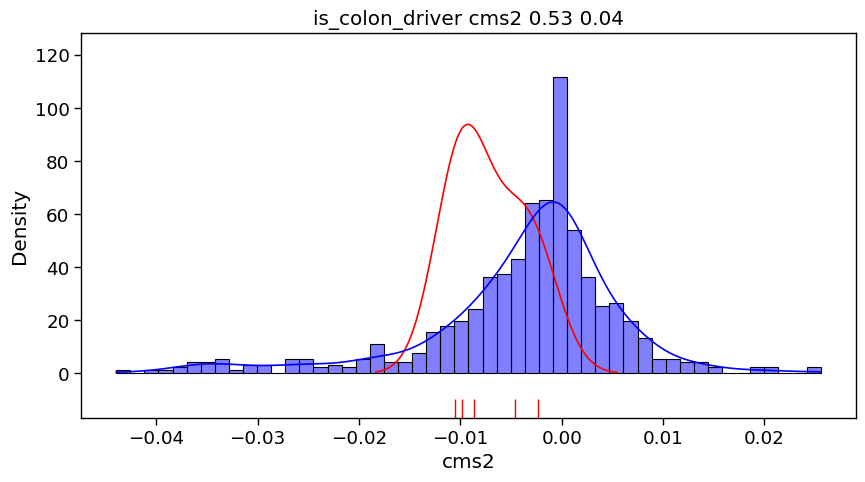

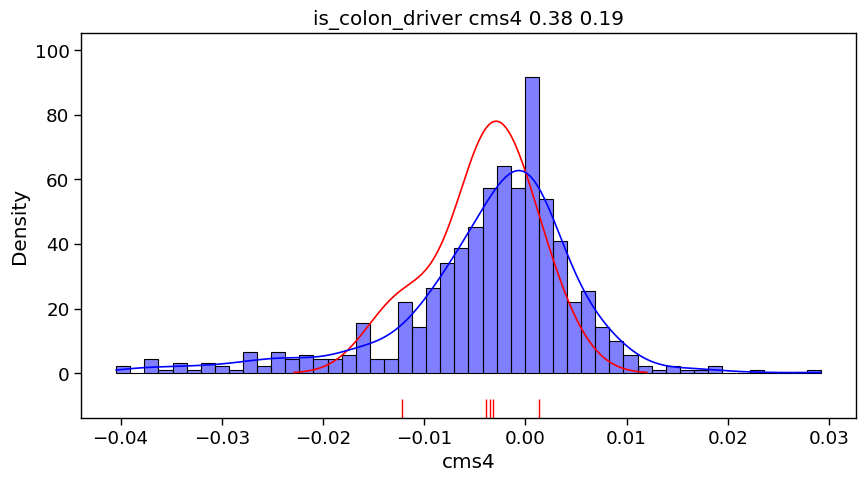

...

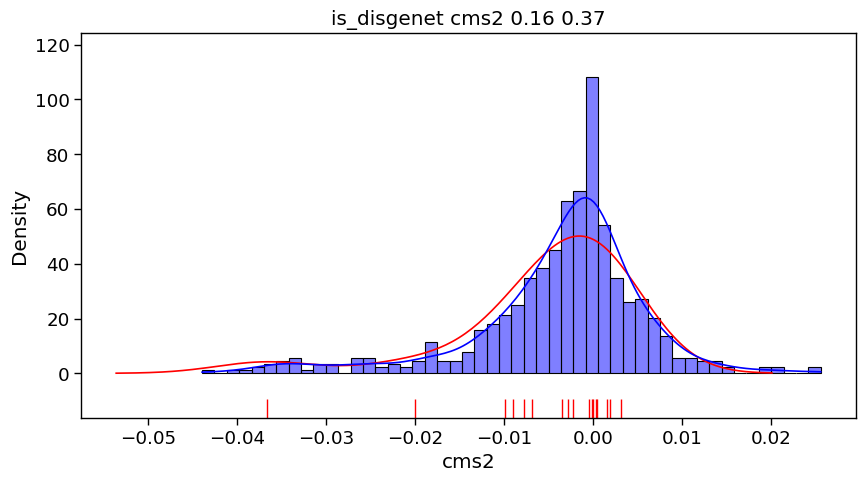

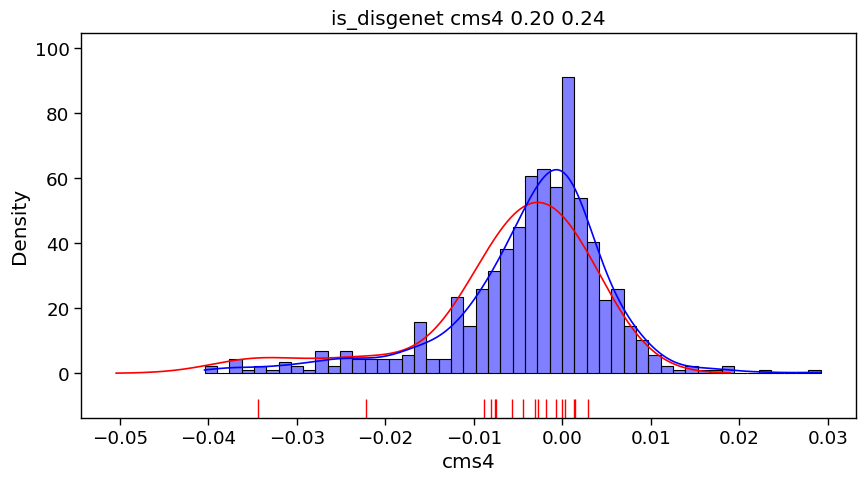

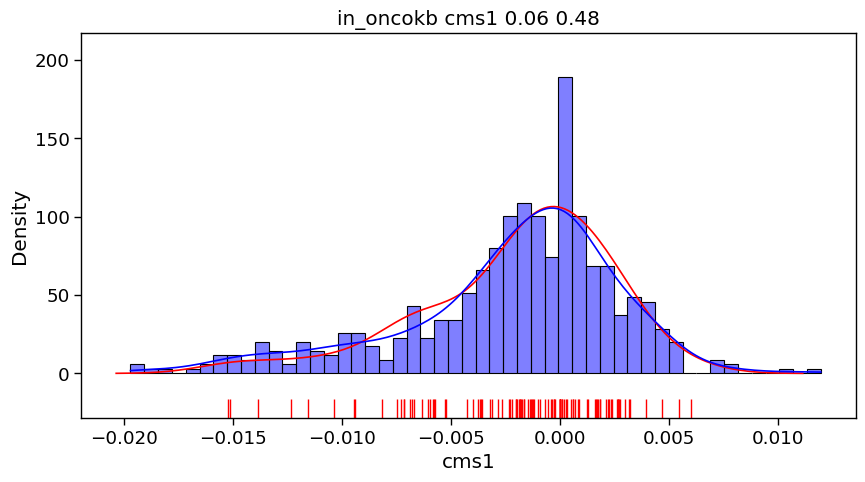

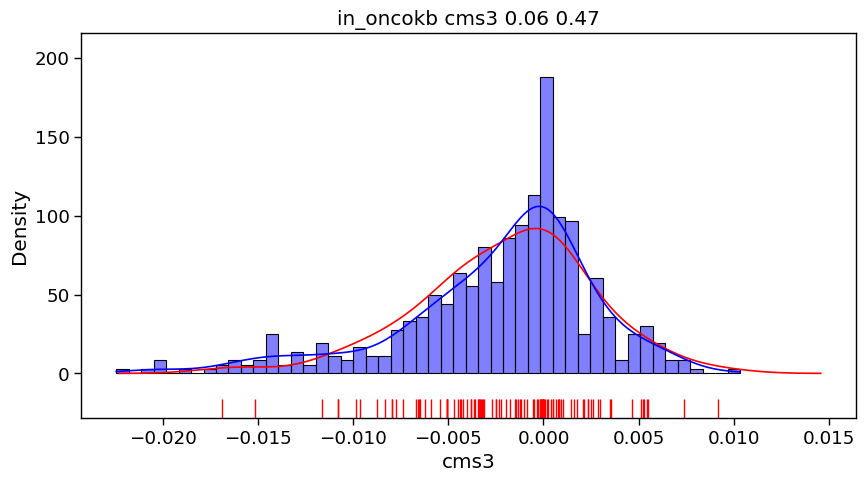

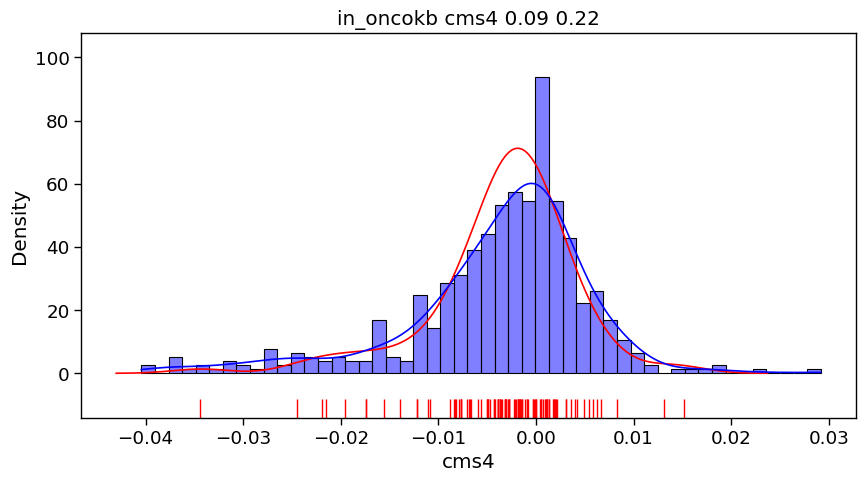

In [384]:
# ks test
data = dragon_trans_same_oncokb
from scipy.stats import ks_2samp
for aaa in ['is_driver', 'is_colon_driver', 'is_disgenet', 'in_oncokb']:
    for ccc in subtype_order:
        ks, p = ks_2samp(data[data[aaa]==1][ccc].fillna(0),data[data[aaa]==0][ccc].fillna(0), alternative = 'greater')
        if p<0.5:
            print(aaa, ccc, ks,p)
            f, ax = plt.subplots(figsize = (10,5))
            sns.rugplot(data[data[aaa]==1][ccc].fillna(0), color = 'red', label = 'Yes', height = .05)
            sns.kdeplot(data[data[aaa]==1][ccc].fillna(0), color = 'red', label = 'Yes')
            sns.histplot(data[data[aaa]==0][ccc].fillna(0), bins = 50, kde = True, stat = 'density', color = 'blue', label = 'No')      
            plt.title(f'{aaa} {ccc} {ks:.2f} {p:.2f}')

## Clustering methylation to expression edges on different TFs


Instead of focusing on silencing, we look at more complex associations between different TFs. 


For inter-modality edges (methylation to expression), we remove the edges between the same transcription factor and we
look for patterns of similarity of the strongest edges between subtypes.

In [385]:
(dragon_trans.node1_type=='methylation').all(),(dragon_trans.node2_type=='expression').all()

(np.True_, np.True_)

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/4286086443.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_trans['abs_mean'] = dragon_trans.loc[:, [i+'_abs' for i in subtype_order]].mean(axis =1)
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/4286086443.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_trans['abs_var'] = dragon_trans.loc[:, [i+'_abs' for i in subtype_order]].var(axis =1)


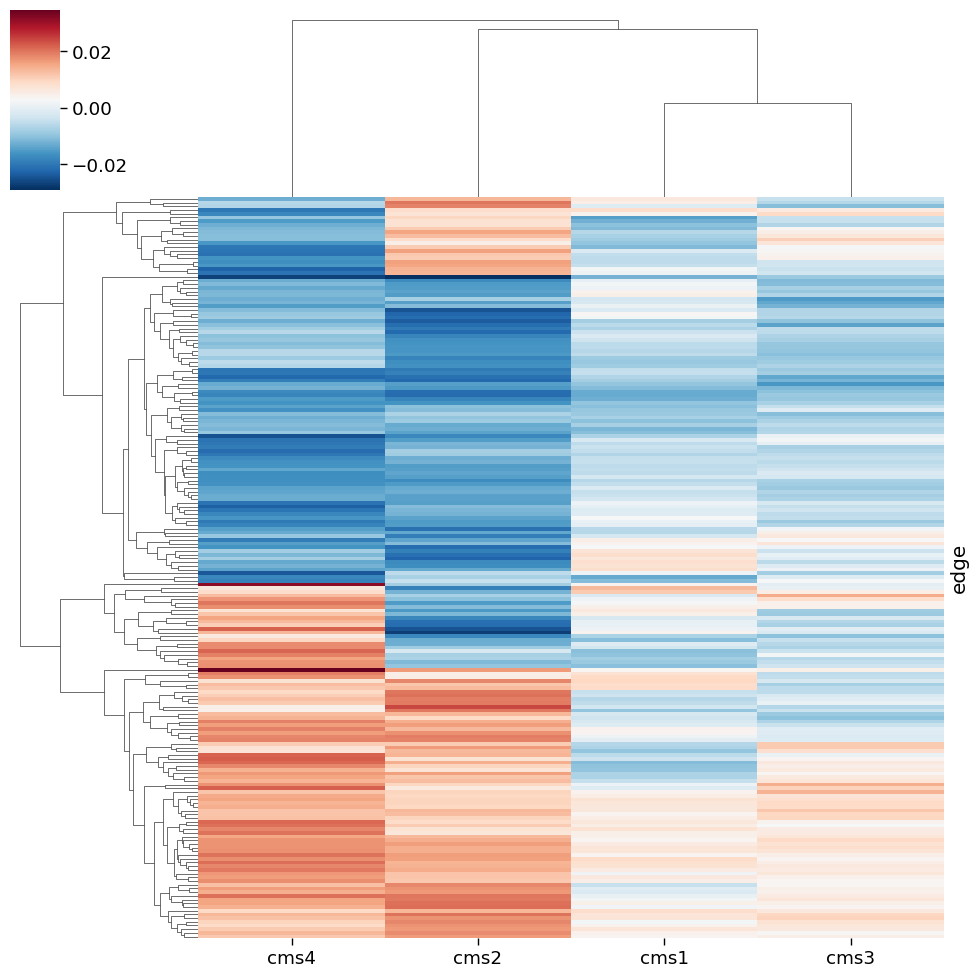

In [386]:
# top edges
K = 200 # this can be changed to include more or less edges, but you will see the cluster pattern to be similar
dragon_trans.loc[:, [i+'_abs' for i in subtype_order] ] = np.abs(dragon_trans.loc[:, subtype_order].values)
dragon_trans['abs_mean'] = dragon_trans.loc[:, [i+'_abs' for i in subtype_order]].mean(axis =1)
dragon_trans['abs_var'] = dragon_trans.loc[:, [i+'_abs' for i in subtype_order]].var(axis =1)

temp = dragon_trans[dragon_trans.node1_tf!=dragon_trans.node2_tf].dropna(subset= subtype_order, axis = 0).sort_values(by = 'abs_mean', ascending = False).iloc[:K,:].loc[:,subtype_order].fillna(0)
g1 = sns.clustermap(temp, cmap = 'RdBu_r', yticklabels = False)

Since we can distinctly recognize clusters of edges that are different between CMS2 and CMS4 we proceed to actually
cluster the data.

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/2319495232.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('plasma', len(temp['cluster'].unique()))


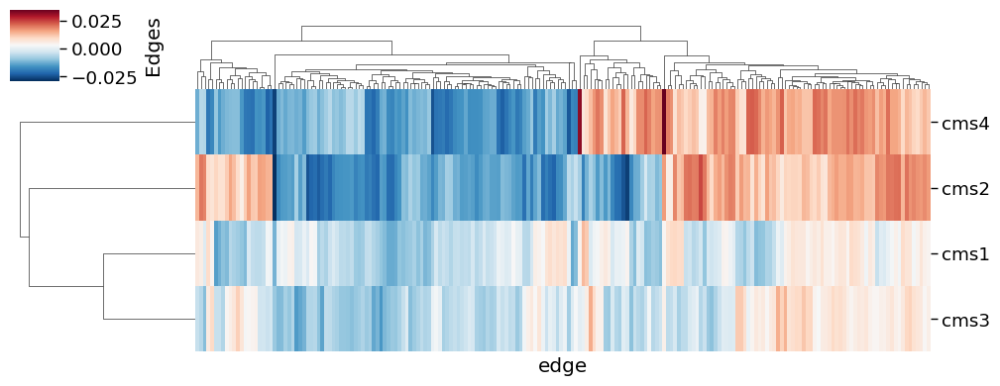

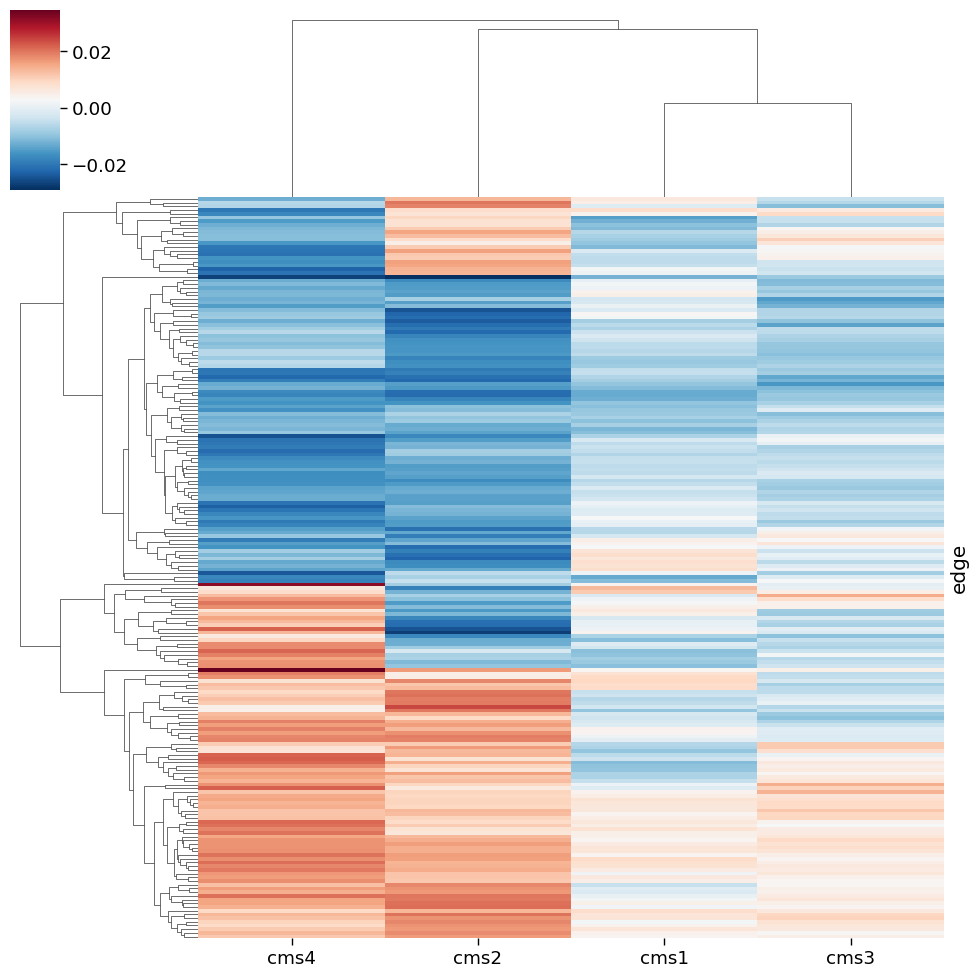

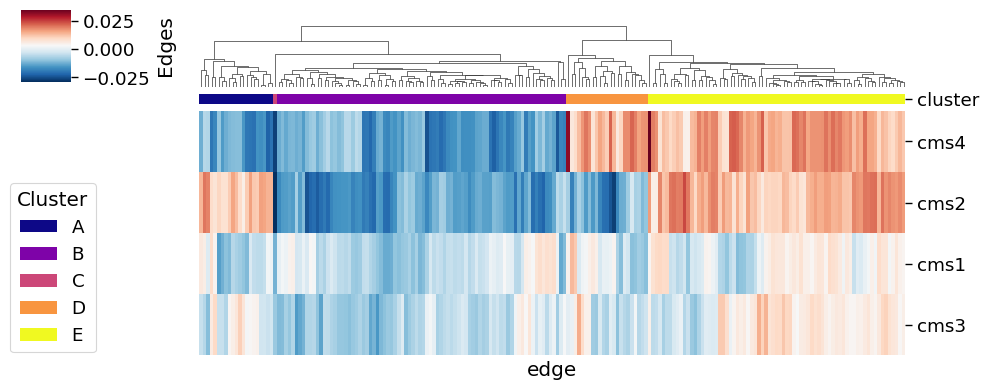

In [387]:
import scipy
import matplotlib
from matplotlib import cm as cm

temp = dragon_trans[dragon_trans.node1_tf!=dragon_trans.node2_tf].dropna(subset= subtype_order, axis = 0).sort_values(by = 'abs_mean', ascending = False).iloc[:K,:].loc[:,subtype_order].fillna(0)

g0 = sns.clustermap(temp.T, xticklabels = False,cmap = 'RdBu_r', cbar_kws={'label': 'Edges'}, yticklabels = True, figsize = (10,4))
# rotate the yticklabels of clustermap g1
g0.ax_heatmap.set_yticklabels(g0.ax_heatmap.get_yticklabels(), rotation=0)
g0.fig.savefig(output_folder+'all_cms_dragon_heatmap.pdf')

g1 = sns.clustermap(temp, cmap = 'RdBu_r', yticklabels = False)

temp['cluster_number'] = scipy.cluster.hierarchy.fcluster(g1.dendrogram_row.linkage, t = 5, criterion = 'maxclust')
# transform number to letter sequentially like a,B,C
temp['cluster'] = [chr(i+65) for i in temp['cluster_number']-1]

cmap = cm.get_cmap('plasma', len(temp['cluster'].unique()))
color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
lut = dict(zip(sorted(temp['cluster'].unique()), color_list))
row_colors = temp['cluster'].map(lut)
# change aspect to clustermap
g1 = sns.clustermap(temp.loc[:,subtype_order].T, col_colors=row_colors, xticklabels = False, 
               cmap = 'RdBu_r', cbar_kws={'label': 'Edges'}, yticklabels = True,
               figsize = (10,4))

# rotate the yticklabels of clustermap g1
g1.ax_heatmap.set_yticklabels(g1.ax_heatmap.get_yticklabels(), rotation=0)

from matplotlib.patches import Patch

handles = [Patch(facecolor=lut[name]) for name in lut]
plt.legend(handles, lut, title='Cluster',
           bbox_to_anchor=(0, 0.1), bbox_transform=plt.gcf().transFigure, loc='lower left')

# remove row dendrogram
g1.ax_row_dendrogram.set_visible(False)
g1.fig.savefig(output_folder+'all_cms_dragon_clustermap.pdf')


**Caption**: For
 inter-modality edges (methylation to expression), we remove the edges between the same transcription factor, and we
 select the first 200 strongest edges (highest average absolute value of correlation) and we cluster them by correlation values for each subtype. Interestingly, for cluster A and
 D the edge values for CMS2 and CMS4 are swapped in direction.


## Analysis and visualization of the different clusters

Now we dig deeper in the TFs that are in the clusters and the subgraph they draw.

In [388]:
temp

,cms1,cms2,cms3,cms4,cluster_number,cluster
edge,,,,,,
ZNF345-ZNF790,-0.012222,-0.028967,-0.009026,-0.026827,3,C
HOXB5-HOXB6,-0.006764,-0.020931,-0.013662,-0.022181,2,B
HOXB8-HOXB6,-0.013081,-0.021357,-0.010234,-0.017450,2,B
HOXB8-HOXB5,-0.013158,-0.021508,-0.009058,-0.018268,2,B
HOXB5-HOXB4,-0.008069,-0.022063,-0.012032,-0.019201,2,B
...,...,...,...,...,...,...
STAT5A-PPARG,0.000949,-0.014860,-0.007660,-0.013302,2,B
ZNF280D-ZNF513,-0.003187,-0.008399,-0.007266,0.017902,4,D
DOT1L-EVX1,0.004228,-0.010934,0.006868,-0.014698,2,B


In [389]:
# We retrieve the clusters
clusts = {}
for i,tab in temp.groupby('cluster'):
    print(i, len(tab))
    meth = [i.split('-')[0] for i in tab.index]
    expr = [i.split('-')[1] for i in tab.index]
    all = meth+expr
    clusts[i] = {}
    clusts[i]['all'] = all
    clusts[i]['meth'] = meth
    clusts[i]['expr'] = expr

A 21
B 82
C 1
D 23
E 73


Now we show the distribution of the edge values for all the TFs in each cluster. We also want to check the general
distribution of the edges, to control that the differences between CMS2 and CMS4 are "interesting" and not just an
overall effect. 

Given the nodes in the heterogeneous edges (M-E) for each cluster $c$, with methylation nodes $m \in M_c$ and expression nodes $e \in E_c$,
we keep all edges between $M_c$ and $E_c$, and select as "of interest" (oi label) those that exactly belong to cluster
$c$. 

Example: if cluster $c$ is made of oi = {M1-E2, M2-E4, M3-E2} we will also keep the edges (M1-E2, M1-E4, M2-E2, M2-E2,
M3-E2, M3-E4) 

This way we have a way to compare the other edges between these TFs.

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:12: FutureWarning: 

(21, 20)
(57, 20)


/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:12: FutureWarning: 

(82, 20)
(115, 20)


/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:12: FutureWarning: 

(1, 20)
(3, 20)


/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:12: FutureWarning: 

(23, 20)
(63, 20)


/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/1855375689.py:12: FutureWarning: 

(73, 20)
(111, 20)


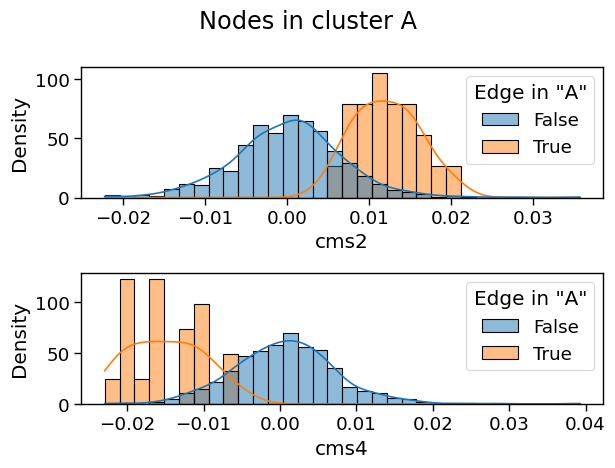

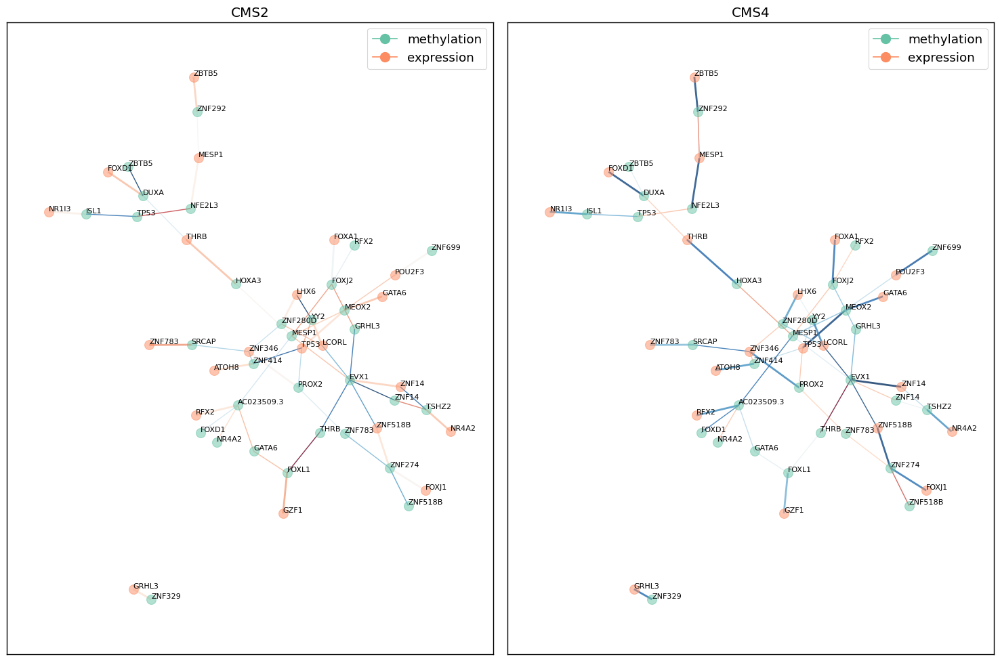

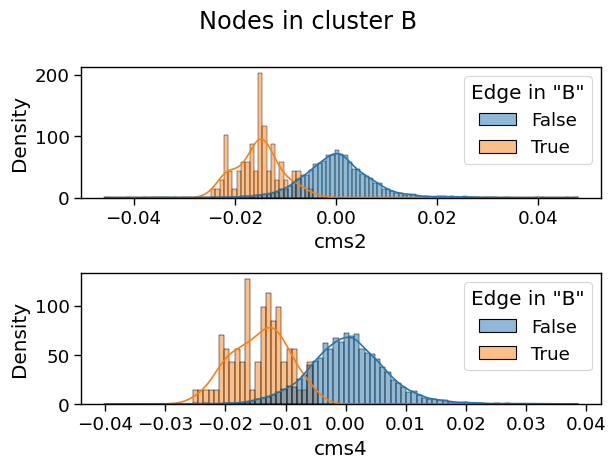

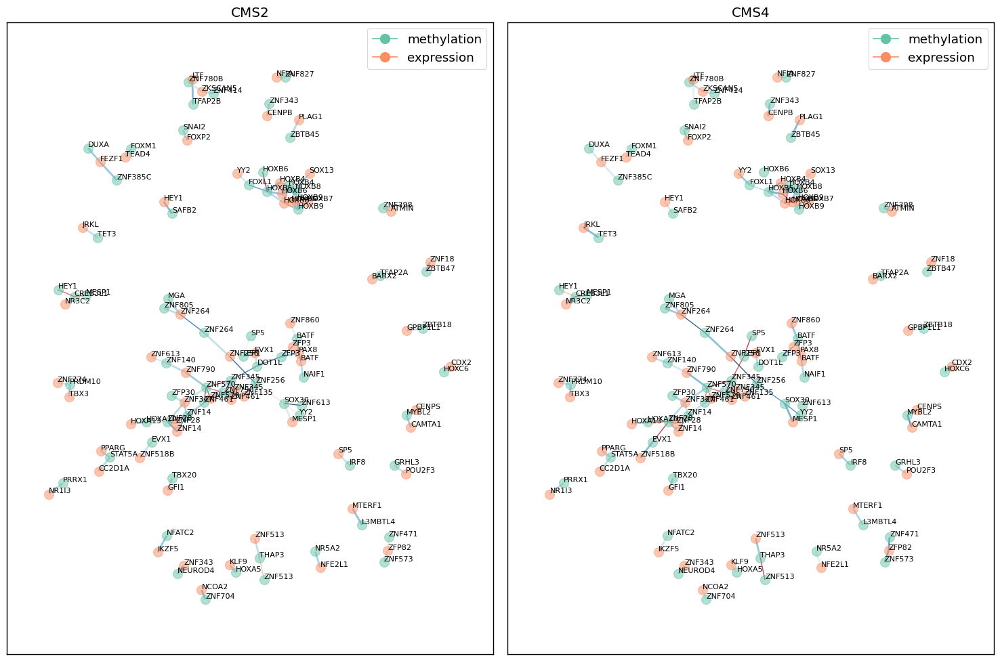

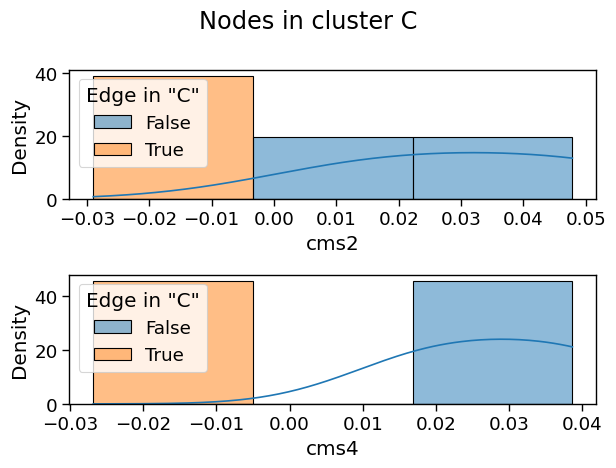

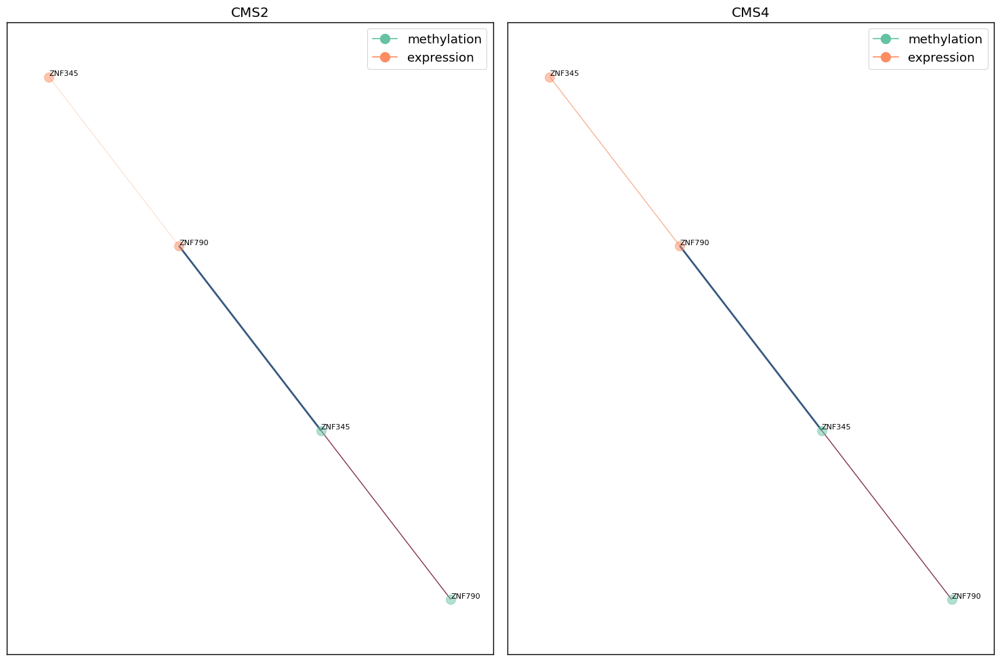

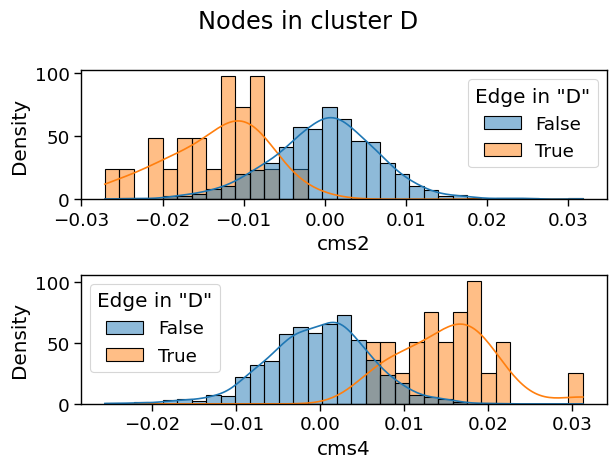

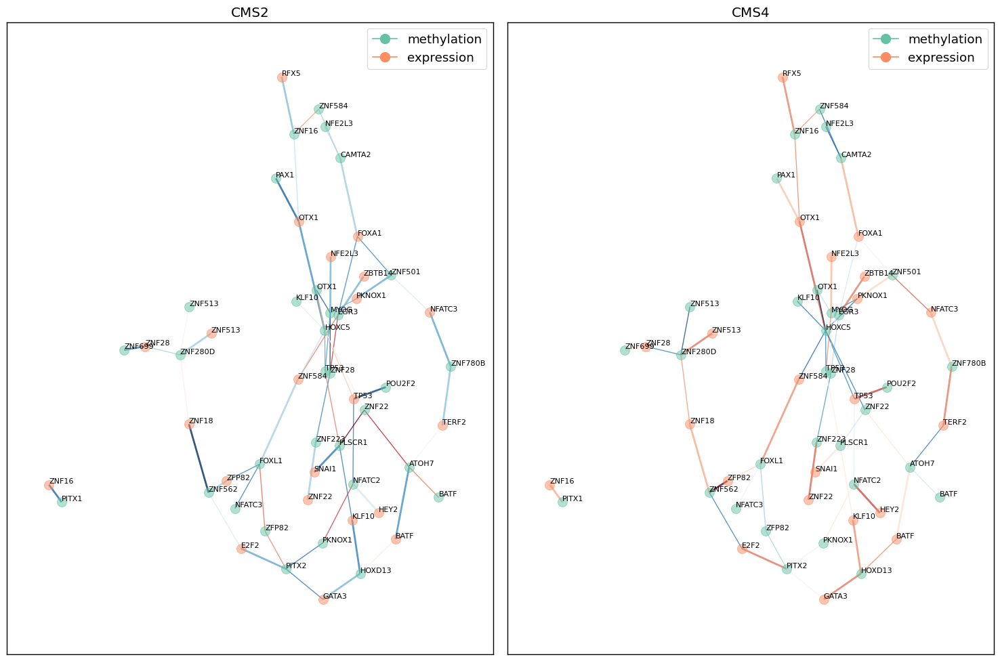

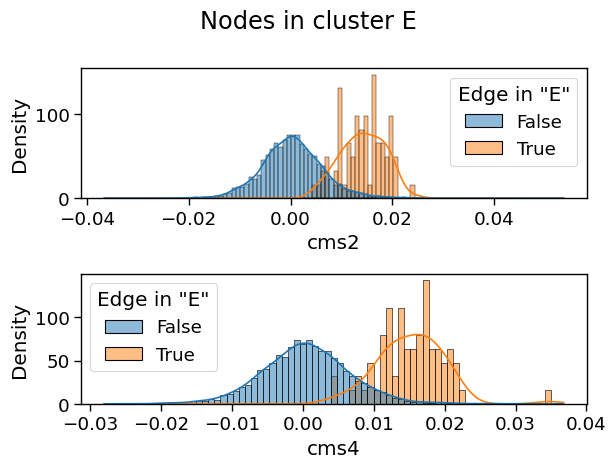

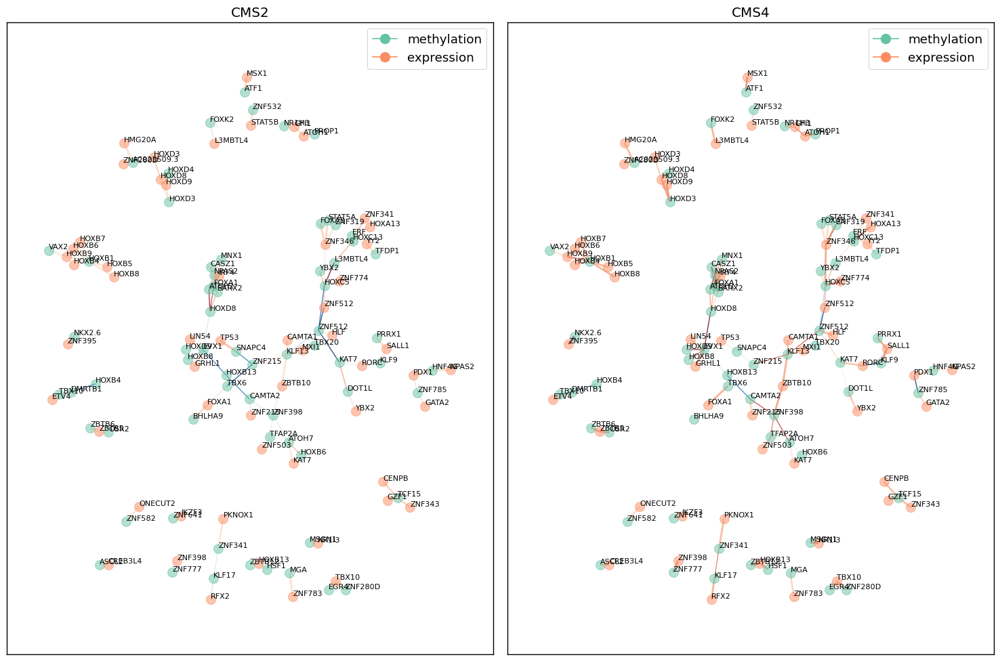

In [394]:
for k in clusts.keys():
    # We get the table with the edges of interest and the edges from the same nodes
    tf1 = [i.split('-')[0] for i in temp[temp['cluster']==k].index]
    tf2 = [i.split('-')[1] for i in temp[temp['cluster']==k].index]
    tf1_meth = [i.split('-')[0]+'_methylation' for i in temp[temp['cluster']==k].index]
    tf2_expr = [i.split('-')[1]+'_expression' for i in temp[temp['cluster']==k].index]
    
    complete_edges = [tf1_meth[i] +'-'+ tf2_expr[i] for i in range(len(tf1_meth))]

    dragon_oi = dragon[(dragon['node1_tf'].isin(tf1)) & (dragon['node2_tf'].isin(tf2)) ]
    dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
    dragon_oi['tf_edge'] = [dragon_oi.node1_tf[i] +'-'+ dragon_oi.node2_tf[i] for i in range(len(dragon_oi))]


    dragon_oi['oi'] = dragon_oi['complete_edge'].isin(complete_edges)
    dragon_oi = dragon_oi.set_index('complete_edge').sort_values(by = 'oi')
    
    # We save the table with the edges for each cluster (both those in the actual luster and those from the same tfs)
    dragon_oi.to_csv(output_folder + 'all_cms_dragon_clust%s.csv' %k)
    
    # Figure of edge of interest distribution
    f, ax = plt.subplots(2, 1)
    mydata = dragon_oi.copy()
    myhue = 'Edge in "%s"' %k
    mydata[myhue] = mydata['oi']
    sns.histplot(x = 'cms2', hue = myhue,data = mydata, common_norm=False, kde = True, stat = 'density', ax = ax[0])
    sns.histplot(x = 'cms4', hue = myhue,data = mydata, common_norm=False, kde = True, stat = 'density', ax = ax[1])
    f.suptitle('Nodes in cluster %s' %k)
    plt.tight_layout()
    f.savefig(output_folder + 'all_cms_edge_distribution_clust%s.pdf' %k)
    
    # Now we plot the graph
    # Get the graph
    graph_oi = dragon_oi[dragon_oi['oi']]
    dragonother = dragon_oi[~dragon_oi['oi']]
    # This would filter by edge values
    #dragon_graph = dragonother[(dragonother.cms2_abs>0.015) | (dragonother.cms4_abs>0.015)]
    
    # We filter the top edges
    K = 20
    dragon_other1 = dragonother.sort_values(by = 'cms2_abs', ascending = False).iloc[:K, :]
    dragon_other2 = dragonother.sort_values(by = 'cms4_abs', ascending = False).iloc[:K, :]
    dragon_graph = pd.concat([graph_oi, dragon_other1, dragon_other2], axis = 0).drop_duplicates()
    print(graph_oi.shape)
    print(dragon_graph.shape)
    
    
    
    import networkx as nx
    dragon_graph['edge_label_oi'] = ['*' if i==True else "" for i in dragon_graph['oi']]
    dragon_graph['edge_label_width'] = [2 if i==True else 1 for i in dragon_graph['oi']]
    G = nx.from_pandas_edgelist(dragon_graph, source = 'node1', target = 'node2', edge_attr = ['cms2', 'cms2_abs','cms4', 'cms4_abs', 'oi', 'edge_label_oi', 'edge_label_width'])
    

    draw_both_graphs(G, output_folder + 'all_cms_graph_cluster%s.pdf' %k)

    
    

#### We draw cluster D again, for better visualization

you can skip the following two cells, these are only made to reproduce the graph figure in the paper. It just cleans the
visualization compared to the grahs above.

In [439]:
for k in ['D']:
    # We get the table with the edges of interest and the edges from the same nodes
    tf1 = [i.split('-')[0] for i in temp[temp['cluster']==k].index]
    tf2 = [i.split('-')[1] for i in temp[temp['cluster']==k].index]
    tf1_meth = [i.split('-')[0]+'_methylation' for i in temp[temp['cluster']==k].index]
    tf2_expr = [i.split('-')[1]+'_expression' for i in temp[temp['cluster']==k].index]
    complete_edges = [tf1_meth[i] +'-'+ tf2_expr[i] for i in range(len(tf1_meth))]

    dragon_oi = dragon[(dragon['node1_tf'].isin(tf1)) & (dragon['node2_tf'].isin(tf2)) ]
    dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
    dragon_oi['diff'] = dragon_oi['cms2'] - dragon_oi['cms4']


    dragon_oi['oi'] = dragon_oi['complete_edge'].isin(complete_edges)
    dragon_oi = dragon_oi.set_index('complete_edge').sort_values(by = 'oi')
    
    
    # Now we plot the graph
    
    # Get the graph
    graph_oi = dragon_oi[dragon_oi['oi']]
    dragonother = dragon_oi[~dragon_oi['oi']]
    # This would filter by edge values
    #dragon_graph = dragonother[(dragonother.cms2_abs>0.015) | (dragonother.cms4_abs>0.015)]
    # We filter the top edges
    K = 20
    dragon_other1 = dragonother.sort_values(by = 'cms2_abs', ascending = False).iloc[:K, :]
    dragon_other2 = dragonother.sort_values(by = 'cms4_abs', ascending = False).iloc[:K, :]
    dragon_graph = pd.concat([graph_oi, dragon_other1, dragon_other2], axis = 0).drop_duplicates()
    
    
    import networkx as nx
    dragon_graph['edge_label_oi'] = ['*' if i==True else "" for i in dragon_graph['oi']]
    dragon_graph['edge_label_width'] = [3 if i==True else 1 for i in dragon_graph['oi']]
    G = nx.from_pandas_edgelist(dragon_graph, source = 'node1', target = 'node2', edge_attr = ['cms2', 'cms2_abs','cms4', 'cms4_abs', 'oi', 'edge_label_oi', 'edge_label_width','diff'])
    

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/3797717627.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/3797717627.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dragon_oi['complete_edge'] = [dragon_oi.node1[i] +'-'+ dragon_oi.node2[i] for i in range(len(dragon_oi))]
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/3797717627.py:11: SettingWithCopy

In [434]:
nx.get_edge_attributes(G,'diff').values()

dict_values([0.0285615618737887, 0.0333562343186875, 0.012196784348972398, 0.0209900094051848, 0.0207991881222697, 0.0183782001003111, 0.021792522206791, 0.017399597441772097, 0.004114637804422198, 0.0269441667494005, 0.0210811252828965, 0.0005546398898264009, 0.027032991479927403, 0.0226340072507381, 0.0192377326603795, 0.030539853249043, 0.021332153045817502, 0.022762504068580398, 0.0149344757823184, 0.028485953259456097, 0.0281353532774947, 0.0132171012519804, 0.014707335252473098, 0.0235159123376801, 0.026478448497303898, 0.003817269227495798, 0.0464440162552168, 0.0186956229863958, 0.025176733683597102, 0.0263006979688701, 0.02411302370822, 0.0082297242614042, 0.0110981777058778, 0.0250931071628617, 0.034703600604557, 0.0125148395408155, 0.0392059847617375, 0.0405866621864131, 0.025892819999771104, 0.0239139932826785, 0.016725340654538498, 0.0235830736723057, 0.0343590481489698, 0.032229859437145, 0.035014845811107795, 0.0202744472211746, 0.016082124407825, 0.011170514227896403, 0

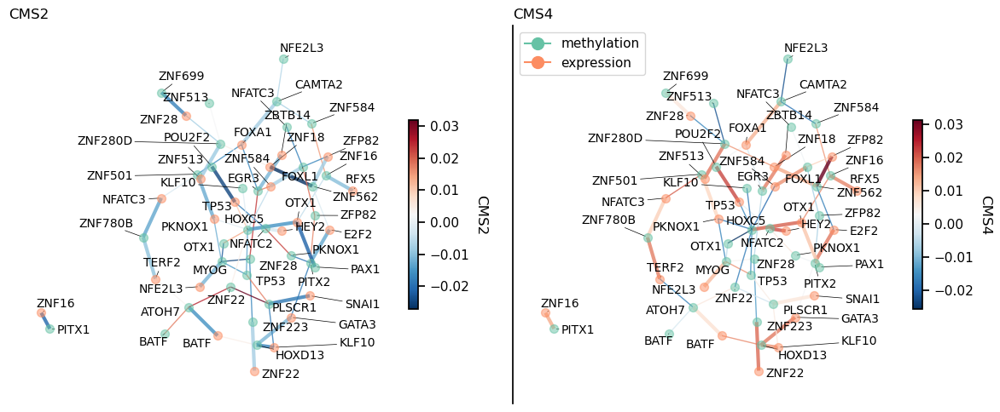

In [445]:

from adjustText import adjust_text
def draw_graphs_clusterd(G, fig_name):
    """Draw both graphs for CMS2 and CMS4"""
    
    pos = nx.spring_layout(G, seed=100, iterations=32,k=1/np.sqrt(G.order()))  # positions for all nodes
    #pos = nx.spectral_layout(G, scale=.1, center=None, dim=2)
    weights2 = nx.get_edge_attributes(G,'cms2').values()
    weights4 = nx.get_edge_attributes(G,'cms4').values()
    edge_labels = nx.get_edge_attributes(G,'edge_label_oi').values()
    edge_width = list(nx.get_edge_attributes(G,'edge_label_width').values())

    f,ax = plt.subplots(1,2,figsize = (12,5))
    options_node = {"node_size": 50, "alpha": 0.5}

    node_meth = [i  for i in list(G.nodes) if i.endswith('methylation') ]
    node_expr = [i  for i in list(G.nodes) if i.endswith('expression') ]

    # Methylation and expression nodes for CMS2
    nx.draw_networkx_nodes(G, pos, nodelist=node_meth, node_color="#66c2a5", **options_node, ax = ax[0])#, edgecolors='k')
    nx.draw_networkx_nodes(G, pos, nodelist=node_expr, node_color="#fc8d62", **options_node, ax = ax[0])#, edgecolors='k')

    # Node labels for methylation
    #nx.draw_networkx_labels(G, pos, {node_meth[k]:node_meth[k].split('_')[0] for k in range(len(node_meth))}, font_size=8, ax = ax[0], verticalalignment='bottom', horizontalalignment='left')
    #nx.draw_networkx_labels(G, pos, {node_meth[k]:node_meth[k].split('_')[0] for k in range(len(node_meth))}, font_size=8, ax = ax[1], verticalalignment='bottom', horizontalalignment='left')

    # Node labels for expression
    #nx.draw_networkx_labels(G, pos, {node_expr[k]:node_expr[k].split('_')[0] for k in range(len(node_expr))}, font_size=8, ax = ax[0], verticalalignment='bottom', horizontalalignment='left')
    #nx.draw_networkx_labels(G, pos, {node_expr[k]:node_expr[k].split('_')[0] for k in range(len(node_expr))}, font_size=8, ax = ax[1], verticalalignment='bottom', horizontalalignment='left')

    # Draw edges
    nx.draw_networkx_edges(G, pos, alpha=0.8, edge_color=[50*i for i in list(weights2)], edge_cmap=plt.cm.RdBu_r,  ax = ax[0], width = edge_width)

    # Draw colorbar for edge weights
    sm = plt.cm.ScalarMappable(cmap=plt.cm.RdBu_r, norm=plt.Normalize(vmin=min(weights2), vmax=max(weights2)))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax[0], shrink=0.5)
    cbar.set_label('CMS2', rotation=270, labelpad=15)

    #nx.draw_networkx_edge_labels(G, pos, edge_labels = nx.get_edge_attributes(G,'edge_label_oi'), ax = ax[0],  bbox={'facecolor':'white', 'edgecolor':'none', 'pad':0})
    #nx.draw_networkx_edge_labels(G, pos, edge_labels = nx.get_edge_attributes(G,'edge_label_oi'), ax = ax[1],  bbox={'facecolor':'white', 'edgecolor':'none', 'pad':0})

    #nx.draw_networkx_labels(G_cms2, pos, {list(G_cms2.nodes)[k]:list(G_cms2.nodes)[k].split('_')[0] for k in range(len(G_cms2.nodes))}, font_size=9)


    meth_node = Line2D([0], [0], marker='o', color='#66c2a5', label='methylation',
                            markersize=10)
    expr_node = Line2D([0], [0], marker='o', color='#fc8d62', label='expression',
                            markersize=10)

    #ax[0].legend(handles=[meth_node, expr_node])
    ax[0].set_title('CMS2', loc = 'left')
    
    # Draw node labels separately
    labels = {node: node for node in G.nodes()}
    texts = []
    for node, (x, y) in pos.items():
        nodename = node.split('_')[0]
        texts.append(ax[0].text(x, y, str(nodename), fontsize=10, ha='center', va='center'))

    # Adjust the text labels to prevent overlap
    adjust_text(texts, arrowprops=dict(arrowstyle="-", color='k', lw=0.5), ax = ax[0])
    #f.savefig(fig_name)
    
    # Methylation and expression nodes for CMS4
    nx.draw_networkx_nodes(G, pos, nodelist=node_meth, node_color="#66c2a5", **options_node, ax = ax[1])#, edgecolors='k')
    nx.draw_networkx_nodes(G, pos, nodelist=node_expr, node_color="#fc8d62", **options_node, ax = ax[1])#, edgecolors='k')
    
    nx.draw_networkx_edges(G, pos, alpha=0.8, edge_color=[50*i for i in list(weights4)], edge_cmap=plt.cm.RdBu_r, ax = ax[1], width = edge_width)
    
    ax[1].legend(handles=[meth_node, expr_node])
    
    # Draw node labels separately
    labels = {node: node for node in G.nodes()}
    texts2 = []
    for node, (x, y) in pos.items():
        nodename = node.split('_')[0]
        texts2.append(ax[1].text(x, y, str(nodename), fontsize=10, ha='center', va='center'))

    # Draw colorbar for edge weights
    sm = plt.cm.ScalarMappable(cmap=plt.cm.RdBu_r, norm=plt.Normalize(vmin=min(weights4), vmax=max(weights4)))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax[1], shrink=0.5)
    cbar.set_label('CMS4', rotation=270, labelpad=15)

    # Adjust the text labels to prevent overlap
    adjust_text(texts2, arrowprops=dict(arrowstyle="-", color='k', lw=0.5), ax = ax[1])
    ax[1].set_title('CMS4', loc = 'left')
    
    plt.subplots_adjust(wspace=0, hspace=0)
    #remove the box around the axis
    #ax[0].axis('off')
    #ax[1].axis('off')
    for i in range(2):
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['bottom'].set_visible(False)
    ax[0].spines['left'].set_visible(False)
    # add only one vertical line to the axis
    #ax[0].axvline(1.1, color='k', linestyle='--')
    plt.tight_layout()
    
    f.savefig(fig_name)

draw_graphs_clusterd(G, output_folder + 'all_cms_clean_graph_clusterD.pdf')

We can try to plot the difference between the two

In [428]:
nx.get_edge_attributes(G,'adiff').values()

dict_values([])

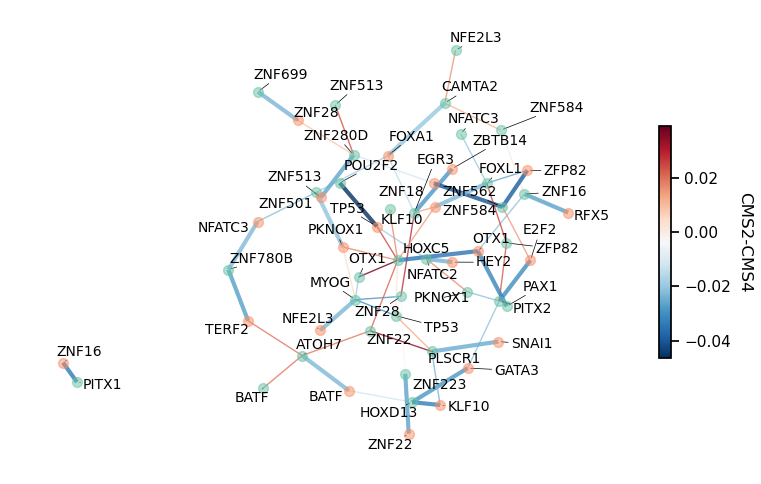

In [447]:
sns.set_context('notebook', font_scale = 1)
from adjustText import adjust_text
def draw_graphs_clusterd(G, fig_name):
    """Draw both graphs for CMS2 and CMS4"""
    
    pos = nx.spring_layout(G, seed=100, iterations=32,k=1/np.sqrt(G.order()))  # positions for all nodes
    #pos = nx.spectral_layout(G, scale=.1, center=None, dim=2)
    weights2 = nx.get_edge_attributes(G,'cms2').values()
    weights4 = nx.get_edge_attributes(G,'cms4').values()
    weights_diff = nx.get_edge_attributes(G,'diff').values()
    weights_abs_diff = nx.get_edge_attributes(G,'diff').values()
    edge_labels = nx.get_edge_attributes(G,'edge_label_oi').values()
    edge_width = list(nx.get_edge_attributes(G,'edge_label_width').values())

    f,ax = plt.subplots(1,1,figsize = (8,5))
    options_node = {"node_size": 50, "alpha": 0.5}

    node_meth = [i  for i in list(G.nodes) if i.endswith('methylation') ]
    node_expr = [i  for i in list(G.nodes) if i.endswith('expression') ]

    # Methylation and expression nodes for CMS2
    nx.draw_networkx_nodes(G, pos, nodelist=node_meth, node_color="#66c2a5", **options_node, ax = ax)#, edgecolors='k')
    nx.draw_networkx_nodes(G, pos, nodelist=node_expr, node_color="#fc8d62", **options_node, ax = ax)#, edgecolors='k')

    # Draw edges
    nx.draw_networkx_edges(G, pos, alpha=0.8, edge_color=[50*i for i in list(weights_abs_diff)], edge_cmap=plt.cm.RdBu_r,  ax = ax, width = edge_width)
    # Draw colorbar for edge weights
    sm = plt.cm.ScalarMappable(cmap=plt.cm.RdBu_r, norm=plt.Normalize(vmin=min(weights_diff), vmax=max(weights_abs_diff)))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, shrink=0.5)
    cbar.set_label('CMS2-CMS4', rotation=270, labelpad=15)

    meth_node = Line2D([0], [0], marker='o', color='#66c2a5', label='methylation',
                            markersize=10)
    expr_node = Line2D([0], [0], marker='o', color='#fc8d62', label='expression',
                            markersize=10)

    #ax[0].legend(handles=[meth_node, expr_node])
    #ax.set_title('CMS2-CMS4|', loc = 'left')
    
    # Draw node labels separately
    labels = {node: node for node in G.nodes()}
    texts = []
    for node, (x, y) in pos.items():
        nodename = node.split('_')[0]
        texts.append(ax.text(x, y, str(nodename), fontsize=10, ha='center', va='center'))

    # Adjust the text labels to prevent overlap
    adjust_text(texts, arrowprops=dict(arrowstyle="-", color='k', lw=0.5), ax = ax)
    #f.savefig(fig_name)
    #remove the box around the axis
    #ax[0].axis('off')
    #ax[1].axis('off')
    for i in range(2):
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
    ax.spines['left'].set_visible(False)
    # add only one vertical line to the axis
    #ax[0].axvline(1.1, color='k', linestyle='--')
    plt.tight_layout()
    
    f.savefig(fig_name)

draw_graphs_clusterd(G, output_folder + 'difference_cms_clean_graph_clusterD.pdf')

## Pathways for each cluster

For each cluster we do a pathway analysis with REACTOME. 

From the [REACTOME database](https://reactome.org/) we have downloaded the tables that map each gene identifier to a
pathway, and that also map each pathway to the parent terms. For instance "Intracellular signaling by second
messengers", "Signaling by GPCR", "Signaling by Hedgehog"...
are all part of the "Signaling Transduction" term.

In the `reactome_child_ancestor.csv` file we have linked each term to the most general term in REACTOME. 

Then, to reduce the number of tested pathways, which also reduces overlaps between pathways, we have generated a "slim"
set of pathways. For each leaf in the reactome dataset, we have kept only the "parent" node. This way we avoid keeping
all the nodes that are too small, and we keep only the `depth-1` term.

The pathways are in the `hugo_reactome_slim.gmt` and we have kept the reactome ID. 

**WARNING** 
Here we are using the gseapy package that can also be used without our own REACTOME pathway files.


In [448]:
reactome_hierarchy_fn = '../data/external/reactome_slim/reactome_child_ancestor.csv'
reactome_gmt_fn ='../data/external/reactome_slim/hugo_reactome_slim.gmt'


It is important to point out that we need to select the correct background for the over representation analysis. 

In [449]:
hierarchy = pd.read_csv(reactome_hierarchy_fn)

import gseapy as gp
bckg = set(dragon.node1_tf).union(set(dragon.node2_tf))
bckg_meth = set(dragon.node1_tf)
bckg_expr = set(dragon.node2_tf)
res_all = {}
res_expr = {}
res_meth = {}
for key, items in clusts.items():
    if len(items['all'])>10:
        res_all[key] = gp.enrich(gene_list=items['all'], gene_sets=reactome_gmt_fn, background = bckg)
        res_expr[key] = gp.enrich(gene_list=items['expr'], gene_sets=reactome_gmt_fn, background = bckg_expr)
        res_meth[key] = gp.enrich(gene_list=items['meth'], gene_sets=reactome_gmt_fn, background = bckg_meth)
        
        res_all[key].res2d.to_csv(output_folder+'all_cms_enrich_all_clust%s.tsv' %key, sep = '\t')
        res_expr[key].res2d.to_csv(output_folder+'all_cms_enrich_expr_clust%s.tsv' %key, sep = '\t')
        res_meth[key].res2d.to_csv(output_folder+'all_cms_enrich_meth_clust%s.tsv' %key, sep = '\t')

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/3046001452.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Set3', len(column.unique()))
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/3046001452.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Set3', len(column.unique()))
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/3046001452.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_c

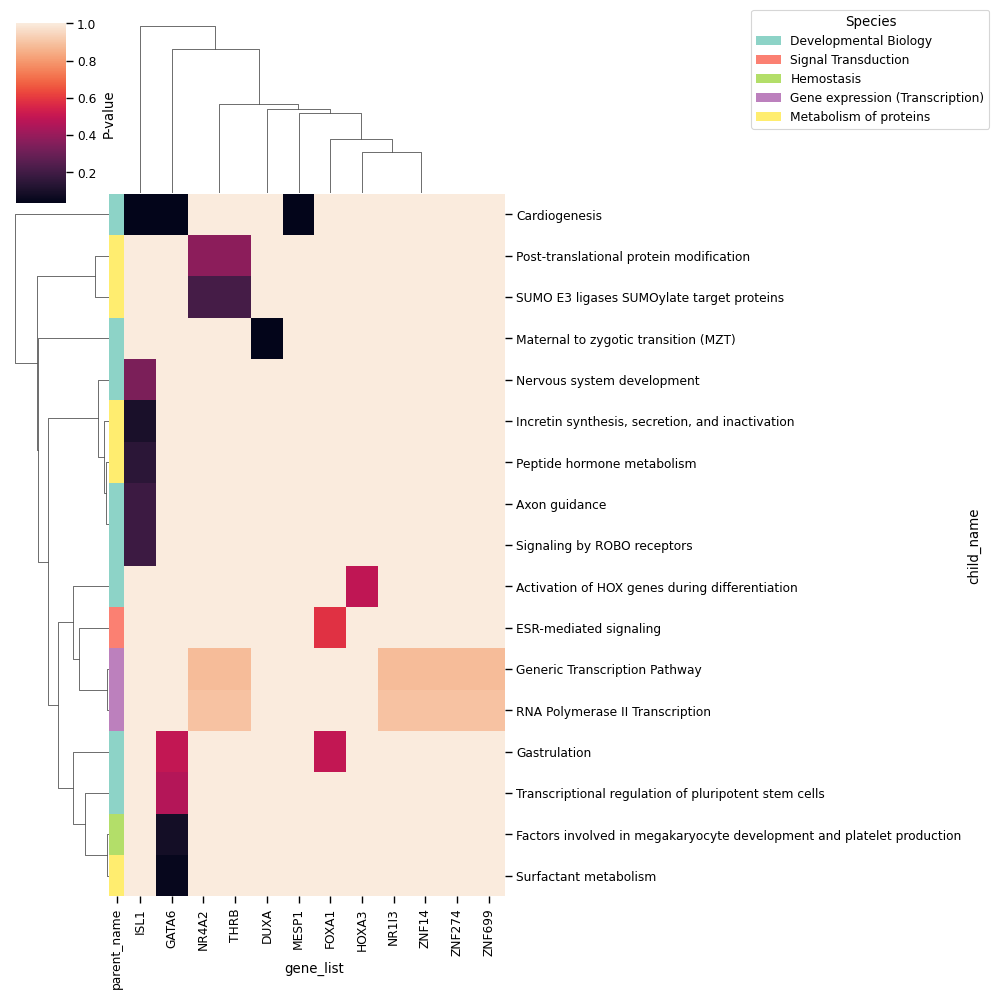

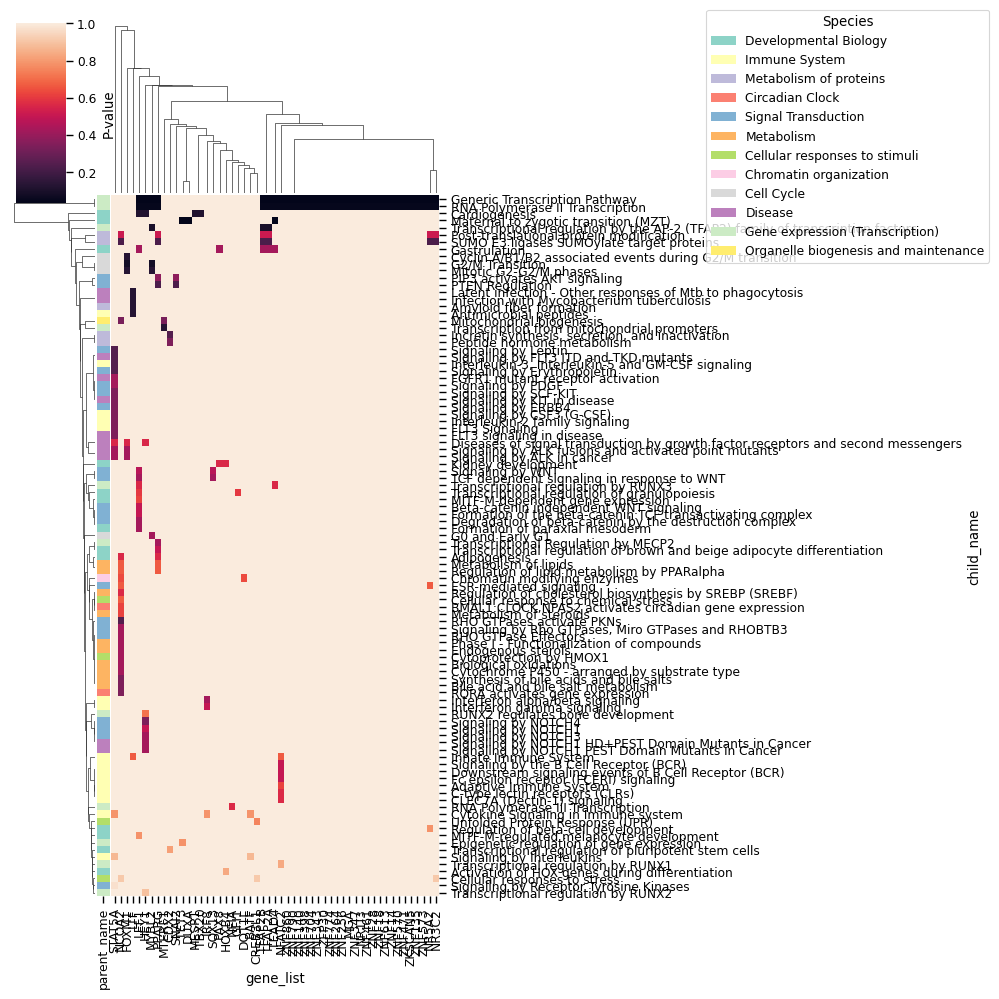

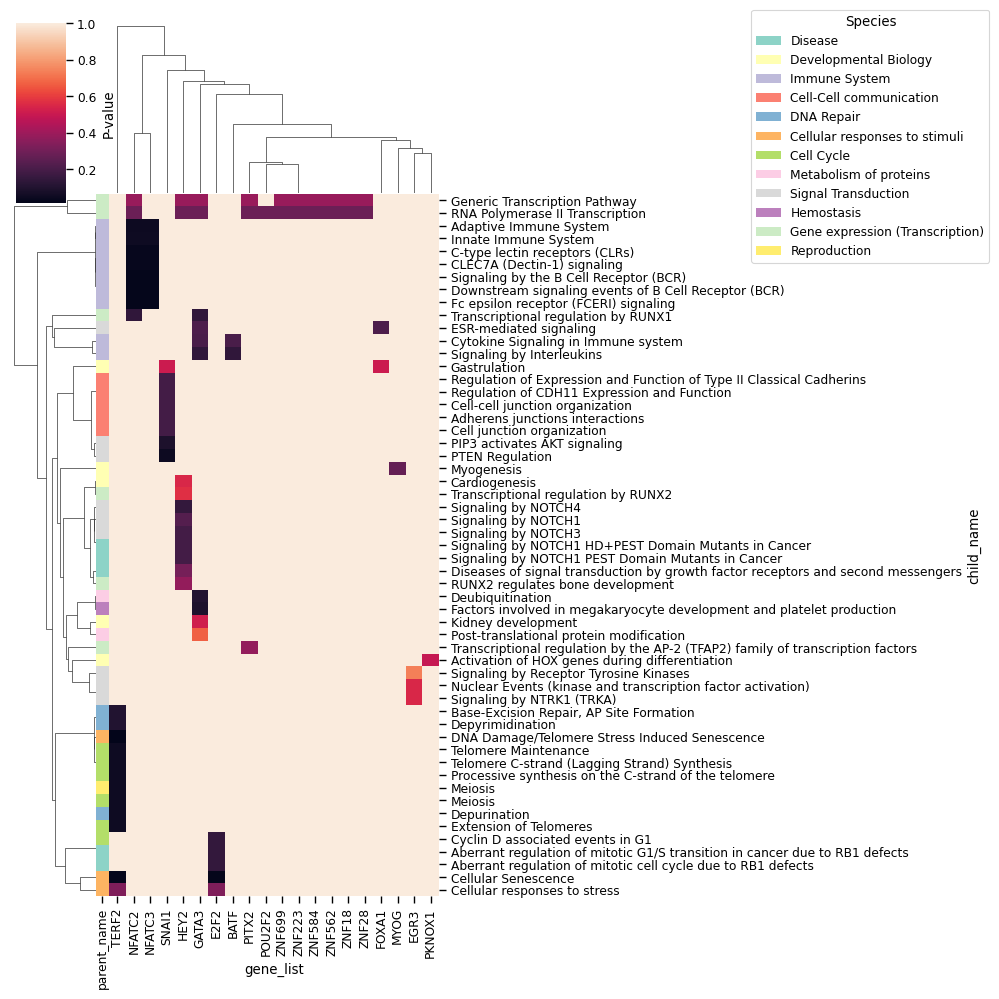

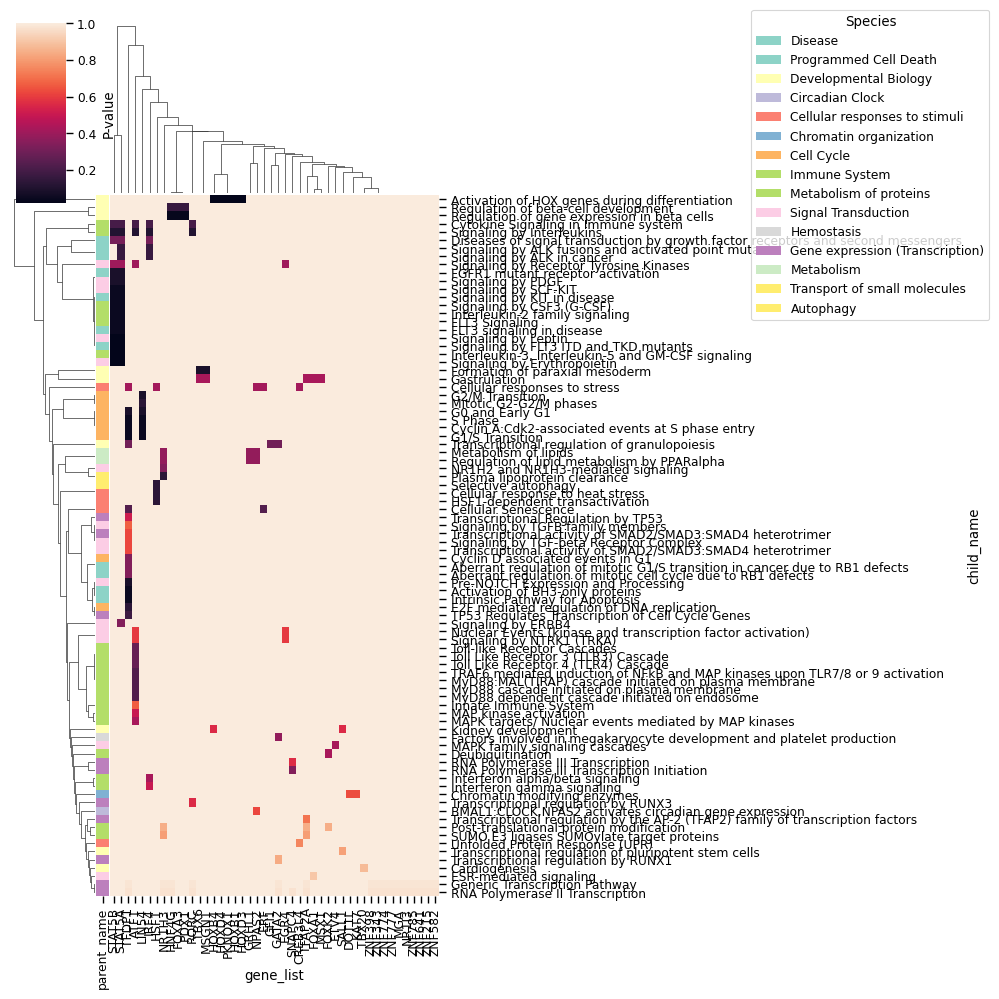

In [450]:
for key, items in res_all.items():
    res_all[key].res2d['gene_list'] = [i.split(';') for i in res_all[key].res2d.Genes]
    res_all
    mytab = pd.pivot_table(res_all[key].res2d.explode('gene_list'), index = 'Term', columns= 'gene_list', values='P-value')
    notp53 = list(set(mytab.columns.tolist()).difference(set(['TP53'])))
    mytab = mytab.loc[:,notp53].dropna(axis = 0,how = 'all').fillna(1)

    mytab_genes = mytab.columns
    mytab_full = mytab.merge(hierarchy, left_index=True, right_on = 'child_name').set_index('child_name')

    column = mytab_full['parent_name']
    cmap = cm.get_cmap('Set3', len(column.unique()))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    lut = dict(zip(column.unique(), color_list))
    row_colors = column.map(lut)
    sns.set_context('paper')



    g1 = sns.clustermap(mytab_full.loc[:,mytab_genes], row_colors=row_colors, yticklabels = 1, xticklabels = 1, cbar_kws={'label': 'P-value'})
    plt.setp(g1.ax_heatmap.xaxis.get_majorticklabels(), rotation=90)


    from matplotlib.patches import Patch

    handles = [Patch(facecolor=lut[name]) for name in lut]
    plt.legend(handles, lut, title='Species',
            bbox_to_anchor=(1, 1), bbox_transform=plt.gcf().transFigure, loc='upper right')

    g1.fig.savefig(output_folder+'all_cms_pathway_tfs_all_clustermap_cluster%s.pdf' %key, bbox_inches = 'tight')

Now we do the same plot but cleaner. We keep only the parent annotation. 

In [567]:
res_all['A'].res2d

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,gene_list
0,hugo_reactome_slim.gmt,Activation of BH3-only proteins,1/3,0.141784,0.354460,11.612658,22.684751,TP53,[TP53]
1,hugo_reactome_slim.gmt,Activation of HOX genes during differentiation,1/13,0.486666,0.575150,2.292152,1.650757,HOXA3,[HOXA3]
2,hugo_reactome_slim.gmt,Antiviral mechanism by IFN-stimulated genes,1/4,0.184535,0.374836,8.283906,13.999128,TP53,[TP53]
3,hugo_reactome_slim.gmt,Axon guidance,1/4,0.184535,0.374836,8.283906,13.999128,ISL1,[ISL1]
4,hugo_reactome_slim.gmt,Cardiogenesis,3/15,0.034024,0.293255,5.633600,19.045471,ISL1;MESP1;GATA6,"[ISL1, MESP1, GATA6]"
...,...,...,...,...,...,...,...,...,...
60,hugo_reactome_slim.gmt,Toll-like Receptor Cascades,1/8,0.335711,0.474375,3.845570,4.197455,TP53,[TP53]
61,hugo_reactome_slim.gmt,Transcriptional Regulation by TP53,1/13,0.486666,0.575150,2.292152,1.650757,TP53,[TP53]
62,hugo_reactome_slim.gmt,Transcriptional activation of p53 responsive g...,1/2,0.096851,0.354460,19.379747,45.243549,TP53,[TP53]
63,hugo_reactome_slim.gmt,Transcriptional regulation by RUNX3,1/14,0.512559,0.584497,2.119550,1.416579,TP53,[TP53]


A
                 Gene_set                                            Term  \
0  hugo_reactome_slim.gmt                 Activation of BH3-only proteins   
1  hugo_reactome_slim.gmt  Activation of HOX genes during differentiation   
2  hugo_reactome_slim.gmt     Antiviral mechanism by IFN-stimulated genes   
3  hugo_reactome_slim.gmt                                   Axon guidance   
4  hugo_reactome_slim.gmt                                   Cardiogenesis   

  Overlap   P-value  Adjusted P-value  Odds Ratio  Combined Score  \
0     1/3  0.141784          0.354460   11.612658       22.684751   
1    1/13  0.486666          0.575150    2.292152        1.650757   
2     1/4  0.184535          0.374836    8.283906       13.999128   
3     1/4  0.184535          0.374836    8.283906       13.999128   
4    3/15  0.034024          0.293255    5.633600       19.045471   

              Genes             gene_list  
0              TP53                [TP53]  
1             HOXA3             

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/898555803.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Set3', len(column.unique()))
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/898555803.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Set3', len(column.unique()))


D
                 Gene_set                                               Term  \
0  hugo_reactome_slim.gmt  Aberrant regulation of mitotic G1/S transition...   
1  hugo_reactome_slim.gmt  Aberrant regulation of mitotic cell cycle due ...   
2  hugo_reactome_slim.gmt                    Activation of BH3-only proteins   
3  hugo_reactome_slim.gmt     Activation of HOX genes during differentiation   
4  hugo_reactome_slim.gmt                             Adaptive Immune System   

  Overlap   P-value  Adjusted P-value  Odds Ratio  Combined Score  \
0     1/3  0.145145          0.290290   11.311111       21.830679   
1     1/3  0.145145          0.290290   11.311111       21.830679   
2     1/3  0.145145          0.290290   11.311111       21.830679   
3    1/13  0.495378          0.554351    2.232593        1.568250   
4     2/7  0.045085          0.199235    8.751438       27.122565   

           Genes         gene_list  
0           E2F2            [E2F2]  
1           E2F2            

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/898555803.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Set3', len(column.unique()))
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/898555803.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Set3', len(column.unique()))


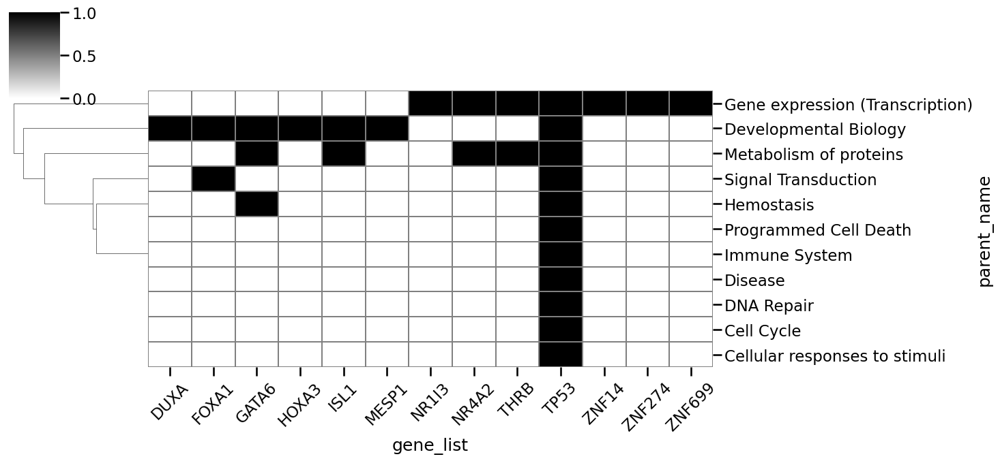

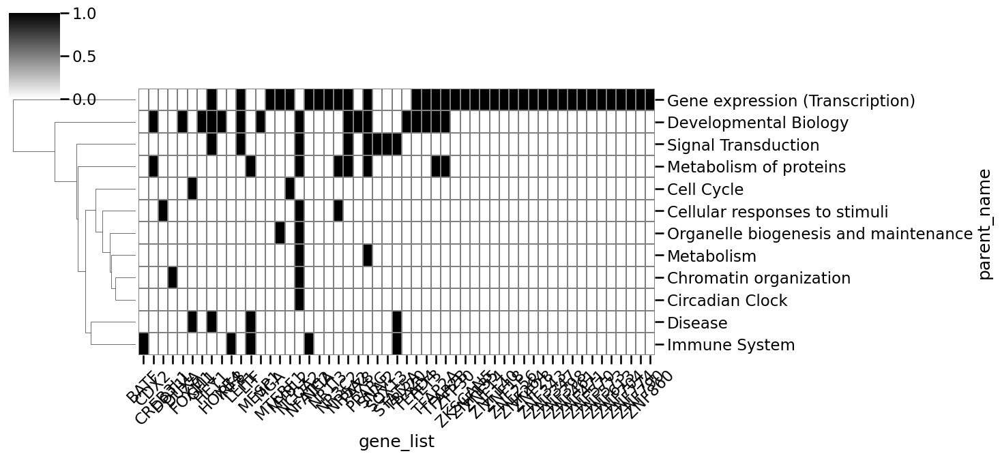

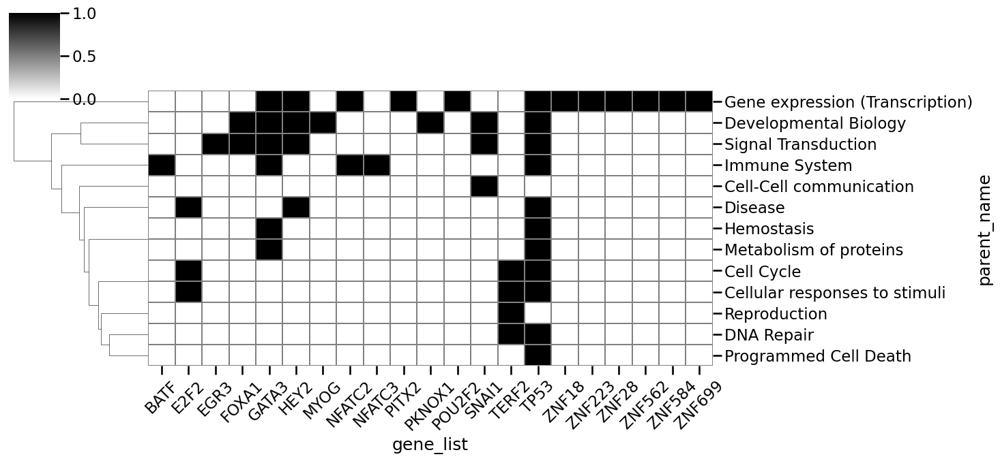

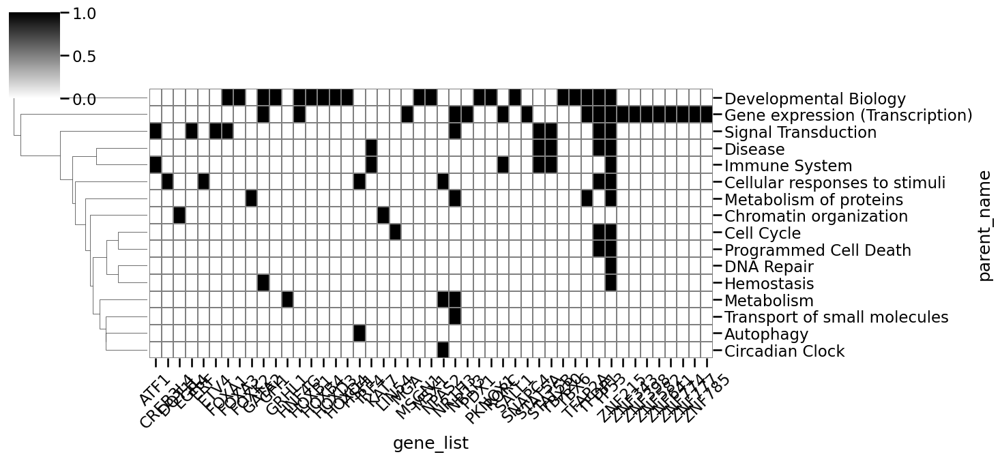

In [451]:
for key, items in res_all.items():
    print(key)
    res_all[key].res2d['gene_list'] = [i.split(';') for i in res_all[key].res2d.Genes]
    print(res_all[key].res2d.head())
    myres = (res_all[key].res2d.merge(hierarchy, left_on='Term', right_on = 'child_name')).copy()
    mytab = pd.pivot_table(myres.explode('gene_list'), index = 'parent_name', columns= 'gene_list', values='P-value')
    #notp53 = list(set(mytab.columns.tolist()).difference(set(['TP53'])))
    #mytab = mytab.loc[:,notp53].dropna(axis = 0,how = 'all').fillna(1)

    mytab_genes = mytab.columns
    mytab_full = mytab.dropna(axis = 0,how = 'all').fillna(1)#mytab.merge(hierarchy, left_index=True, right_on = 'child_name').set_index('child_name')

    column = mytab_full.index
    cmap = cm.get_cmap('Set3', len(column.unique()))
    color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
    lut = dict(zip(column.unique(), color_list))
    row_colors = column.map(lut)
    sns.set_context('talk')
    # white line for the clustermap

    current_data = 1*(mytab_full.loc[:,mytab_genes]<1)
    g1 = sns.clustermap(current_data, yticklabels = 1, xticklabels = 1, col_cluster=False, figsize=(15,7), lw = .2, cmap = 'binary', **{'linecolor':'grey'})
    plt.setp(g1.ax_heatmap.xaxis.get_majorticklabels(), rotation=45)


    from matplotlib.patches import Patch

    #handles = [Patch(facecolor=lut[name]) for name in lut]
    #plt.legend(handles, lut, title='Species',
    #        bbox_to_anchor=(1, 1), bbox_transform=plt.gcf().transFigure, loc='upper right')

    g1.fig.savefig(output_folder+'all_cms_parent_tfs_all_clustermap_cluster%s.pdf' %key, bbox_inches = 'tight')

We can also look at the pathway analysis in a qualitative way, by checking the actual p-values. 

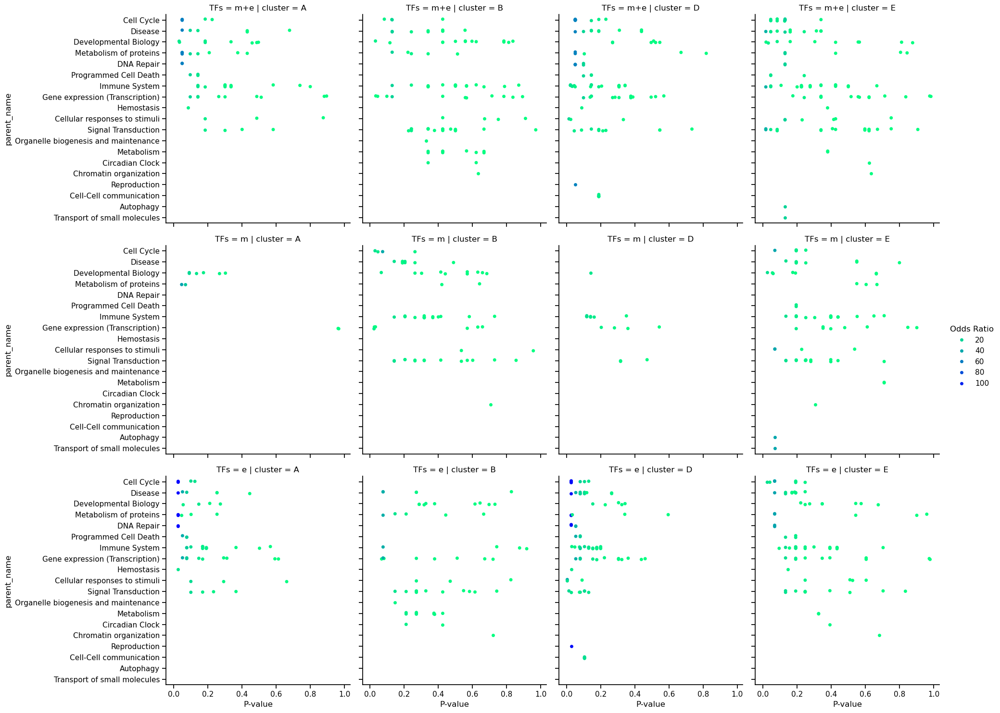

In [452]:
res_14 = pd.DataFrame()
for i in res_all.keys():
    for rrr,tab in {'m+e':res_all, 'm':res_meth, 'e': res_expr}.items():
        temp = tab[i].res2d.merge(hierarchy, left_on = 'Term', right_on = 'child_name').sort_values(by = 'Adjusted P-value')
        temp['cluster'] = str(i)
        temp['TFs'] = rrr
        res_14 = pd.concat([res_14, temp], axis = 0)
        
sns.set_context('notebook')
g1 = sns.catplot(x = 'P-value', y = 'parent_name', data = res_14, hue = 'Odds Ratio', col ='cluster', row = 'TFs', palette='winter_r')
g1.fig.savefig(output_folder + 'all_cms_reactome_parents_bycluster.pdf')

For simplicity, let's clean the figure above and keep only the clusters we are interested in

In [457]:
res_14

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,gene_list,child,ancestor,parent_code,parent_name,parent_species,child_code,child_name,child_species,cluster,TFs,log10(p)
18,hugo_reactome_slim.gmt,G2/M Checkpoints,1/1,0.049628,0.293255,58.215190,174.832108,TP53,[TP53],R-HSA-69481,R-HSA-1640170,R-HSA-1640170,Cell Cycle,Homo sapiens,R-HSA-69481,G2/M Checkpoints,Homo sapiens,A,all tfs,1.304275
28,hugo_reactome_slim.gmt,Loss of Function of TP53 in Cancer,1/1,0.049628,0.293255,58.215190,174.832108,TP53,[TP53],R-HSA-9723907,R-HSA-1643685,R-HSA-1643685,Disease,Homo sapiens,R-HSA-9723907,Loss of Function of TP53 in Cancer,Homo sapiens,A,all tfs,1.304275
19,hugo_reactome_slim.gmt,G2/M DNA damage checkpoint,1/1,0.049628,0.293255,58.215190,174.832108,TP53,[TP53],R-HSA-69473,R-HSA-1640170,R-HSA-1640170,Cell Cycle,Homo sapiens,R-HSA-69473,G2/M DNA damage checkpoint,Homo sapiens,A,all tfs,1.304275
4,hugo_reactome_slim.gmt,Cardiogenesis,3/15,0.034024,0.293255,5.633600,19.045471,ISL1;MESP1;GATA6,"[ISL1, MESP1, GATA6]",R-HSA-9733709,R-HSA-1266738,R-HSA-1266738,Developmental Biology,Homo sapiens,R-HSA-9733709,Cardiogenesis,Homo sapiens,A,all tfs,1.468216
52,hugo_reactome_slim.gmt,Surfactant metabolism,1/1,0.049628,0.293255,58.215190,174.832108,GATA6,[GATA6],R-HSA-5683826,R-HSA-392499,R-HSA-392499,Metabolism of proteins,Homo sapiens,R-HSA-5683826,Surfactant metabolism,Homo sapiens,A,all tfs,1.304275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,hugo_reactome_slim.gmt,Signaling by NTRK1 (TRKA),1/15,0.546240,0.570518,1.919540,1.160738,EGR3,[EGR3],R-HSA-187037,R-HSA-162582,R-HSA-162582,Signal Transduction,Homo sapiens,R-HSA-187037,Signaling by NTRK1 (TRKA),Homo sapiens,D,all tfs,0.262616
89,hugo_reactome_slim.gmt,Transcriptional regulation by RUNX2,1/16,0.569760,0.588543,1.793309,1.008808,HEY2,[HEY2],R-HSA-8878166,R-HSA-74160,R-HSA-74160,Gene expression (Transcription),Homo sapiens,R-HSA-8878166,Transcriptional regulation by RUNX2,Homo sapiens,D,all tfs,0.244308
54,hugo_reactome_slim.gmt,Post-translational protein modification,2/44,0.670477,0.685053,1.077439,0.430723,GATA3;TP53,"[GATA3, TP53]",R-HSA-597592,R-HSA-392499,R-HSA-392499,Metabolism of proteins,Homo sapiens,R-HSA-597592,Post-translational protein modification,Homo sapiens,D,all tfs,0.173616
76,hugo_reactome_slim.gmt,Signaling by Receptor Tyrosine Kinases,1/25,0.734349,0.742245,1.120937,0.346113,EGR3,[EGR3],R-HSA-9006934,R-HSA-162582,R-HSA-162582,Signal Transduction,Homo sapiens,R-HSA-9006934,Signaling by Receptor Tyrosine Kinases,Homo sapiens,D,all tfs,0.134098


In [461]:
temp.sort_values(by = 'Adjusted P-value')

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,gene_list,child,ancestor,parent_code,parent_name,parent_species,child_code,child_name,child_species,cluster,TFs,log10(p)
45,hugo_reactome_slim.gmt,Meiosis,1/1,0.050868,0.199235,56.703704,168.892644,TERF2,[TERF2],R-HSA-1500620,R-HSA-1474165,R-HSA-1474165,Reproduction,Homo sapiens,R-HSA-1500620,Meiosis,Homo sapiens,D,all tfs,1.293551
9,hugo_reactome_slim.gmt,CLEC7A (Dectin-1) signaling,2/6,0.033265,0.199235,10.710267,36.449781,NFATC3;NFATC2,"[NFATC3, NFATC2]",R-HSA-5607764,R-HSA-168256,R-HSA-168256,Immune System,Homo sapiens,R-HSA-5607764,CLEC7A (Dectin-1) signaling,Homo sapiens,D,all tfs,1.478015
13,hugo_reactome_slim.gmt,Cellular Senescence,3/13,0.024494,0.199235,6.541126,24.263169,TERF2;E2F2;TP53,"[TERF2, E2F2, TP53]",R-HSA-2559583,R-HSA-8953897,R-HSA-8953897,Cellular responses to stimuli,Homo sapiens,R-HSA-2559583,Cellular Senescence,Homo sapiens,D,all tfs,1.610940
37,hugo_reactome_slim.gmt,Innate Immune System,3/17,0.050539,0.199235,4.711599,14.064188,NFATC3;TP53;NFATC2,"[NFATC3, TP53, NFATC2]",R-HSA-168249,R-HSA-168256,R-HSA-168256,Immune System,Homo sapiens,R-HSA-168249,Innate Immune System,Homo sapiens,D,all tfs,1.296375
8,hugo_reactome_slim.gmt,C-type lectin receptors (CLRs),2/6,0.033265,0.199235,10.710267,36.449781,NFATC3;NFATC2,"[NFATC3, NFATC2]",R-HSA-5621481,R-HSA-168256,R-HSA-168256,Immune System,Homo sapiens,R-HSA-5621481,C-type lectin receptors (CLRs),Homo sapiens,D,all tfs,1.478015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,hugo_reactome_slim.gmt,Signaling by NTRK1 (TRKA),1/15,0.546240,0.570518,1.919540,1.160738,EGR3,[EGR3],R-HSA-187037,R-HSA-162582,R-HSA-162582,Signal Transduction,Homo sapiens,R-HSA-187037,Signaling by NTRK1 (TRKA),Homo sapiens,D,all tfs,0.262616
89,hugo_reactome_slim.gmt,Transcriptional regulation by RUNX2,1/16,0.569760,0.588543,1.793309,1.008808,HEY2,[HEY2],R-HSA-8878166,R-HSA-74160,R-HSA-74160,Gene expression (Transcription),Homo sapiens,R-HSA-8878166,Transcriptional regulation by RUNX2,Homo sapiens,D,all tfs,0.244308
54,hugo_reactome_slim.gmt,Post-translational protein modification,2/44,0.670477,0.685053,1.077439,0.430723,GATA3;TP53,"[GATA3, TP53]",R-HSA-597592,R-HSA-392499,R-HSA-392499,Metabolism of proteins,Homo sapiens,R-HSA-597592,Post-translational protein modification,Homo sapiens,D,all tfs,0.173616
76,hugo_reactome_slim.gmt,Signaling by Receptor Tyrosine Kinases,1/25,0.734349,0.742245,1.120937,0.346113,EGR3,[EGR3],R-HSA-9006934,R-HSA-162582,R-HSA-162582,Signal Transduction,Homo sapiens,R-HSA-9006934,Signaling by Receptor Tyrosine Kinases,Homo sapiens,D,all tfs,0.134098


In [484]:
g1.axes[0,0].set_xlim(0,1)

(0.0, 1.0)

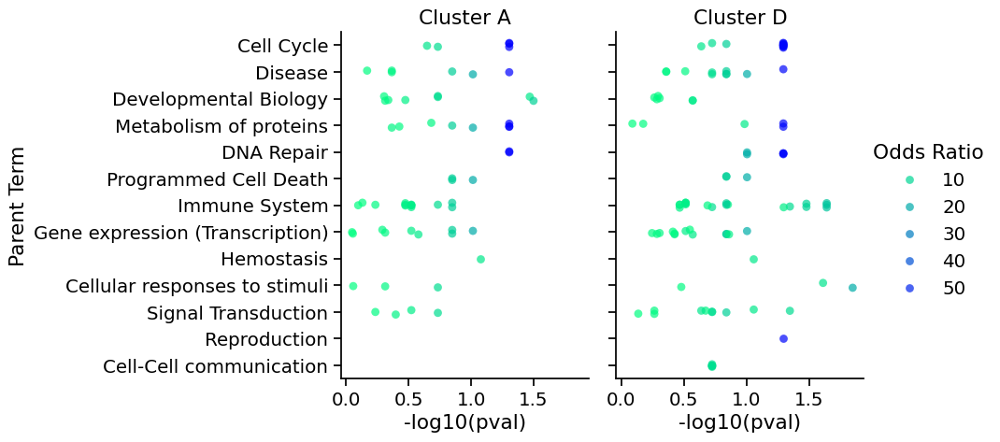

In [490]:
# NOW WE CLEAN THE ONE ABOVE
sns.set_context('notebook', font_scale = 1.3)
res_14 = pd.DataFrame()
for i in ['A','D']:
    for rrr,tab in {'all tfs':res_all}.items():
        temp = tab[i].res2d.merge(hierarchy, left_on = 'Term', right_on = 'child_name').sort_values(by = 'Adjusted P-value')
        temp['cluster'] = str(i)
        temp['TFs'] = rrr
        temp['-log10(pval)'] = -np.log10(temp['P-value'])
        res_14 = pd.concat([res_14, temp], axis = 0)
        
        
g1 = sns.catplot(x = '-log10(pval)', y = 'parent_name', data = res_14, hue = 'Odds Ratio', col ='cluster', row = 'TFs', palette='winter_r', s =40, alpha = 0.7)
g1.set_ylabels('Parent Term')
g1.axes[0,0].set_title('Cluster A')
g1.axes[0,1].set_title('Cluster D')
g1.fig.savefig(output_folder + 'all_cms_reactome_parents_bycluster_ADonly.pdf')

## Validation of co-expression edges

We downloaded the stringDB network for Human (9606) that includes details of the co-expression between genes. 

In [492]:
# Network
stringdb = pd.read_csv('../data/external/9606.protein.links.detailed.v12.0.txt', sep=' ')
stringdb.head()

,protein1,protein2,neighborhood,fusion,cooccurence,coexpression,experimental,database,textmining,combined_score
0,9606.ENSP00000000233,9606.ENSP00000356607,0,0,0,45,134,0,81,173
1,9606.ENSP00000000233,9606.ENSP00000427567,0,0,0,0,128,0,70,154
2,9606.ENSP00000000233,9606.ENSP00000253413,0,0,0,118,49,0,69,151
3,9606.ENSP00000000233,9606.ENSP00000493357,0,0,0,56,53,0,457,471
4,9606.ENSP00000000233,9606.ENSP00000324127,0,0,0,0,46,0,197,201


In [ ]:
# We also need the details for the protein names
stringdb_info = pd.read_csv('../data/external/9606.protein.info.v12.0.txt', sep='\t')
stringdb_info.head()

,#string_protein_id,preferred_name,protein_size,annotation
0,9606.ENSP00000000233,ARF5,180,ADP-ribosylation factor 5; GTP-binding protein...
1,9606.ENSP00000000412,M6PR,277,Cation-dependent mannose-6-phosphate receptor;...
2,9606.ENSP00000001008,FKBP4,459,"Peptidyl-prolyl cis-trans isomerase FKBP4, N-t..."
3,9606.ENSP00000001146,CYP26B1,512,Cytochrome P450 26B1; Involved in the metaboli...
4,9606.ENSP00000002125,NDUFAF7,441,"Protein arginine methyltransferase NDUFAF7, mi..."


In [494]:
# We rename the proteins with the gene names
stringdb['gene1'] = stringdb['protein1'].map(stringdb_info.set_index('#string_protein_id')['preferred_name'])
stringdb['gene2'] = stringdb['protein2'].map(stringdb_info.set_index('#string_protein_id')['preferred_name'])
# We get the edges
stringdb['edge'] = stringdb['gene1'] + '_' + stringdb['gene2']
stringdb_edges = set(stringdb['edge']).union(set(stringdb['gene2'] + '_' + stringdb['gene1']))
stringdb_genes = set(stringdb['gene1']).union(set(stringdb['gene2']))

array([[0.   , 0.   , 0.   , ..., 0.   , 0.081, 0.173],
       [0.   , 0.   , 0.   , ..., 0.   , 0.07 , 0.154],
       [0.   , 0.   , 0.   , ..., 0.   , 0.069, 0.151],
       ...,
       [0.   , 0.   , 0.   , ..., 0.   , 0.227, 0.226],
       [0.   , 0.   , 0.   , ..., 0.   , 0.146, 0.169],
       [0.   , 0.   , 0.   , ..., 0.   , 0.227, 0.251]])

In [520]:
# Stringdb values are confidence scores, 0 to 1, multiplied by 1000
stringdb.iloc[:, 2:-3] = 1/1000*stringdb.iloc[:, 2:-3].values

/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/2040608550.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0. 0. 0. ... 0. 0. 0.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  stringdb.iloc[:, 2:-3] = 1/1000*stringdb.iloc[:, 2:-3].values
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/2040608550.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0. 0. 0. ... 0. 0. 0.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  stringdb.iloc[:, 2:-3] = 1/1000*stringdb.iloc[:, 2:-3].values
/var/folders/1b/jphhn26s4zgfr0k1rxj7wfqr0000gn/T/ipykernel_69098/2040608550.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0. 0. 0. ... 0. 0. 0.]' has dtype incompatible 

In [521]:
stringdb

,protein1,protein2,neighborhood,fusion,cooccurence,coexpression,experimental,database,textmining,combined_score,gene1,gene2,edge
0,9606.ENSP00000000233,9606.ENSP00000356607,0.0,0.0,0.0,0.045,0.134,0.0,0.081,0.173,ARF5,RALGPS2,ARF5_RALGPS2
1,9606.ENSP00000000233,9606.ENSP00000427567,0.0,0.0,0.0,0.000,0.128,0.0,0.070,0.154,ARF5,FHDC1,ARF5_FHDC1
2,9606.ENSP00000000233,9606.ENSP00000253413,0.0,0.0,0.0,0.118,0.049,0.0,0.069,0.151,ARF5,ATP6V1E1,ARF5_ATP6V1E1
3,9606.ENSP00000000233,9606.ENSP00000493357,0.0,0.0,0.0,0.056,0.053,0.0,0.457,0.471,ARF5,CYTH2,ARF5_CYTH2
4,9606.ENSP00000000233,9606.ENSP00000324127,0.0,0.0,0.0,0.000,0.046,0.0,0.197,0.201,ARF5,PSD3,ARF5_PSD3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13715399,9606.ENSP00000501317,9606.ENSP00000475489,0.0,0.0,0.0,0.060,0.099,0.0,0.126,0.195,RFX7,MPHOSPH9,RFX7_MPHOSPH9
13715400,9606.ENSP00000501317,9606.ENSP00000370447,0.0,0.0,0.0,0.055,0.111,0.0,0.079,0.158,RFX7,VCX,RFX7_VCX
13715401,9606.ENSP00000501317,9606.ENSP00000312272,0.0,0.0,0.0,0.000,0.000,0.0,0.227,0.226,RFX7,YPEL2,RFX7_YPEL2
13715402,9606.ENSP00000501317,9606.ENSP00000402092,0.0,0.0,0.0,0.000,0.067,0.0,0.146,0.169,RFX7,SAMD3,RFX7_SAMD3


In [522]:
dragon['edge-tf'] = dragon['node1_tf'] + '_' + dragon['node2_tf']
dragon['edge'] = dragon['node1'] + '_' + dragon['node2']
dragon

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,node2_tf,cms1_abs,cms2_abs,cms3_abs,cms4_abs,same,edge-tf,edge,stringdb,isin_stringdb
edge,,,,,,,,,,,,,,,,,,,,,
AC023509.3-AC092835.1,AC023509.3_methylation,AC092835.1_methylation,0.010079,-0.002448,-0.012452,0.011108,0.001572,0.009022,1.253803e-04,methylation,...,AC092835.1,0.010079,0.002448,0.012452,0.011108,0,AC023509.3_AC092835.1,AC023509.3_methylation_AC092835.1_methylation,False,False
AC023509.3-AC138696.1,AC023509.3_methylation,AC138696.1_methylation,0.001609,0.008164,0.006137,0.004494,0.005101,0.005101,7.673131e-06,methylation,...,AC138696.1,0.001609,0.008164,0.006137,0.004494,0,AC023509.3_AC138696.1,AC023509.3_methylation_AC138696.1_methylation,False,False
AC023509.3-AEBP1,AC023509.3_methylation,AEBP1_expression,-0.005313,0.002291,0.003407,-0.005202,-0.001204,0.004053,2.211596e-05,methylation,...,AEBP1,0.005313,0.002291,0.003407,0.005202,0,AC023509.3_AEBP1,AC023509.3_methylation_AEBP1_expression,False,False
AC023509.3-AEBP1,AC023509.3_methylation,AEBP1_methylation,-0.001914,-0.004333,0.000148,0.002592,-0.000877,0.002247,8.701038e-06,methylation,...,AEBP1,0.001914,0.004333,0.000148,0.002592,0,AC023509.3_AEBP1,AC023509.3_methylation_AEBP1_methylation,False,False
AC023509.3-AEBP2,AC023509.3_methylation,AEBP2_expression,0.001178,0.001567,0.001819,0.001794,0.001590,0.001590,8.831465e-08,methylation,...,AEBP2,0.001178,0.001567,0.001819,0.001794,0,AC023509.3_AEBP2,AC023509.3_methylation_AEBP2_expression,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDC-ZSCAN16,ZXDC_methylation,ZSCAN16_expression,-0.002064,-0.003141,0.000656,0.002289,-0.000565,0.002038,6.173828e-06,methylation,...,ZSCAN16,0.002064,0.003141,0.000656,0.002289,0,ZXDC_ZSCAN16,ZXDC_methylation_ZSCAN16_expression,False,True
ZXDC-ZSCAN22,ZXDC_methylation,ZSCAN22_expression,-0.003214,0.004883,0.003083,0.008613,0.003341,0.004948,2.440332e-05,methylation,...,ZSCAN22,0.003214,0.004883,0.003083,0.008613,0,ZXDC_ZSCAN22,ZXDC_methylation_ZSCAN22_expression,False,True
ZXDC-ZSCAN9,ZXDC_methylation,ZSCAN9_expression,-0.001471,0.001704,0.003811,0.008864,0.003227,0.003963,1.883655e-05,methylation,...,ZSCAN9,0.001471,0.001704,0.003811,0.008864,0,ZXDC_ZSCAN9,ZXDC_methylation_ZSCAN9_expression,False,True


In [523]:
# Now we annotate the dragon edges with the stringdb edges
dragon['stringdb'] = dragon['edge-tf'].isin(stringdb_edges)
# This is sleecting for the genes that are in strindb, the problem is that we can't assess edges that were not sampled
# at all
dragon['isin_stringdb'] = dragon['node1_tf'].isin(stringdb_genes) & dragon['node2_tf'].isin(stringdb_genes)
dragon

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,node2_tf,cms1_abs,cms2_abs,cms3_abs,cms4_abs,same,edge-tf,edge,stringdb,isin_stringdb
edge,,,,,,,,,,,,,,,,,,,,,
AC023509.3-AC092835.1,AC023509.3_methylation,AC092835.1_methylation,0.010079,-0.002448,-0.012452,0.011108,0.001572,0.009022,1.253803e-04,methylation,...,AC092835.1,0.010079,0.002448,0.012452,0.011108,0,AC023509.3_AC092835.1,AC023509.3_methylation_AC092835.1_methylation,False,False
AC023509.3-AC138696.1,AC023509.3_methylation,AC138696.1_methylation,0.001609,0.008164,0.006137,0.004494,0.005101,0.005101,7.673131e-06,methylation,...,AC138696.1,0.001609,0.008164,0.006137,0.004494,0,AC023509.3_AC138696.1,AC023509.3_methylation_AC138696.1_methylation,False,False
AC023509.3-AEBP1,AC023509.3_methylation,AEBP1_expression,-0.005313,0.002291,0.003407,-0.005202,-0.001204,0.004053,2.211596e-05,methylation,...,AEBP1,0.005313,0.002291,0.003407,0.005202,0,AC023509.3_AEBP1,AC023509.3_methylation_AEBP1_expression,False,False
AC023509.3-AEBP1,AC023509.3_methylation,AEBP1_methylation,-0.001914,-0.004333,0.000148,0.002592,-0.000877,0.002247,8.701038e-06,methylation,...,AEBP1,0.001914,0.004333,0.000148,0.002592,0,AC023509.3_AEBP1,AC023509.3_methylation_AEBP1_methylation,False,False
AC023509.3-AEBP2,AC023509.3_methylation,AEBP2_expression,0.001178,0.001567,0.001819,0.001794,0.001590,0.001590,8.831465e-08,methylation,...,AEBP2,0.001178,0.001567,0.001819,0.001794,0,AC023509.3_AEBP2,AC023509.3_methylation_AEBP2_expression,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDC-ZSCAN16,ZXDC_methylation,ZSCAN16_expression,-0.002064,-0.003141,0.000656,0.002289,-0.000565,0.002038,6.173828e-06,methylation,...,ZSCAN16,0.002064,0.003141,0.000656,0.002289,0,ZXDC_ZSCAN16,ZXDC_methylation_ZSCAN16_expression,False,True
ZXDC-ZSCAN22,ZXDC_methylation,ZSCAN22_expression,-0.003214,0.004883,0.003083,0.008613,0.003341,0.004948,2.440332e-05,methylation,...,ZSCAN22,0.003214,0.004883,0.003083,0.008613,0,ZXDC_ZSCAN22,ZXDC_methylation_ZSCAN22_expression,False,True
ZXDC-ZSCAN9,ZXDC_methylation,ZSCAN9_expression,-0.001471,0.001704,0.003811,0.008864,0.003227,0.003963,1.883655e-05,methylation,...,ZSCAN9,0.001471,0.001704,0.003811,0.008864,0,ZXDC_ZSCAN9,ZXDC_methylation_ZSCAN9_expression,False,True


In [524]:
# Let's actually merge the tables
stringdb_double = pd.concat([stringdb, stringdb.rename(columns = {'gene1':'gene2','gene2':'gene1'})], axis = 0)
stringdb_double.edge = stringdb_double['gene1'] + '_' + stringdb_double['gene2']
df_dragon_stringdb = dragon.merge(stringdb_double, left_on = ["node1_tf","node2_tf"], right_on = ["gene1","gene2"], how = 'left', suffixes=['_dragon','_stringdb'])

In [525]:
# keep only possible edges where both genes are in stringdb
df_dragon_stringdb = df_dragon_stringdb[df_dragon_stringdb['isin_stringdb'] == True]

In [537]:
df_dragon_stringdb['node1'].str.split('_').str[1]

4380        expression
4381        expression
4382        expression
4383        expression
4384        expression
              ...     
1204973    methylation
1204974    methylation
1204975    methylation
1204976    methylation
1204977    methylation
Name: node1, Length: 1191865, dtype: object

In [538]:
df_dragon_stringdb['type1'] = df_dragon_stringdb['node1'].str.split('_').str[1]
df_dragon_stringdb['type2'] = df_dragon_stringdb['node2'].str.split('_').str[1]
df_dragon_stringdb['edge_type'] = df_dragon_stringdb['type1'] + '-' + df_dragon_stringdb['type2']

In [539]:
df_dragon_stringdb[df_dragon_stringdb.fillna(0)['coexpression'] > 0]


,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,experimental,database,textmining,combined_score,gene1,gene2,edge_stringdb,type1,type2,edge_type
4388,AEBP1_expression,ARID3A_expression,0.001617,0.005322,-0.000021,-0.004534,0.000596,0.002874,0.000017,expression,...,0.0,0.0,0.175,0.178,AEBP1,ARID3A,AEBP1_ARID3A,expression,expression,expression-expression
4389,AEBP1_expression,ARID3A_expression,0.001617,0.005322,-0.000021,-0.004534,0.000596,0.002874,0.000017,expression,...,0.0,0.0,0.175,0.178,AEBP1,ARID3A,AEBP1_ARID3A,expression,expression,expression-expression
4399,AEBP1_expression,ATOH8_expression,0.000317,-0.005356,-0.001325,-0.002131,-0.002124,0.002282,0.000006,expression,...,0.0,0.0,0.353,0.375,AEBP1,ATOH8,AEBP1_ATOH8,expression,expression,expression-expression
4400,AEBP1_expression,ATOH8_expression,0.000317,-0.005356,-0.001325,-0.002131,-0.002124,0.002282,0.000006,expression,...,0.0,0.0,0.353,0.375,AEBP1,ATOH8,AEBP1_ATOH8,expression,expression,expression-expression
4411,AEBP1_expression,BHLHE41_expression,0.002796,0.004451,-0.000529,0.010371,0.004272,0.004537,0.000021,expression,...,0.0,0.0,0.155,0.162,AEBP1,BHLHE41,AEBP1_BHLHE41,expression,expression,expression-expression
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1204946,ZXDC_methylation,ZNF75D_expression,0.008816,-0.002043,0.002112,0.001486,0.002593,0.003614,0.000021,methylation,...,0.0,0.0,0.000,0.456,ZXDC,ZNF75D,ZXDC_ZNF75D,methylation,expression,methylation-expression
1204951,ZXDC_methylation,ZNF777_expression,0.000188,0.001936,-0.000704,0.001747,0.000792,0.001144,0.000002,methylation,...,0.0,0.0,0.000,0.166,ZXDC,ZNF777,ZXDC_ZNF777,methylation,expression,methylation-expression
1204952,ZXDC_methylation,ZNF777_expression,0.000188,0.001936,-0.000704,0.001747,0.000792,0.001144,0.000002,methylation,...,0.0,0.0,0.000,0.166,ZXDC,ZNF777,ZXDC_ZNF777,methylation,expression,methylation-expression
1204955,ZXDC_methylation,ZNF783_expression,0.001029,0.002099,0.001744,0.005918,0.002698,0.002698,0.000005,methylation,...,0.0,0.0,0.096,0.168,ZXDC,ZNF783,ZXDC_ZNF783,methylation,expression,methylation-expression


In [563]:
def draw_scatter_stringdb(df, x = ['cms1','cms2','cms3','cms4'], y = 'coexpression', savename = None):
    sns.set_context("notebook", font_scale=1.5)
    """Draw scatter plot for stringdb"""
    nc = len(x)
    f, ax = plt.subplots(nc, 3, figsize=(nc*5, 18))
    colors = ['#80b1d3','#fdb462','#b3b3b3']
    for k,col in enumerate(x):
        for p, et in enumerate(['methylation-methylation','methylation-expression','expression-expression']):
            temp = df[df['edge_type'] == et]
            sns.scatterplot(x = col, y = y, data = temp, ax = ax[k,p], color = colors[p], alpha = 0.5)
            # Add a regression line
            ax[k,p].set_xlabel(col)
            ax[k,p].set_ylabel('StringDB(%s)' %y)
            ax[k,p].set_title(et)
    if savename is not None:
        plt.tight_layout()
        f.savefig(savename, bbox_inches = 'tight', dpi = 300)
            
    plt.tight_layout()
    return(f)

In [555]:
stringdb.sort_values(by = 'coexpression', ascending = False).head(10)

,protein1,protein2,neighborhood,fusion,cooccurence,coexpression,experimental,database,textmining,combined_score,gene1,gene2,edge
638420,9606.ENSP00000225430,9606.ENSP00000262584,0.115,0.0,0.000,0.999,0.995,0.90,0.623,0.999,RPL19,RPL8,RPL19_RPL8
6395740,9606.ENSP00000346050,9606.ENSP00000339795,0.000,0.0,0.000,0.999,0.980,0.00,0.785,0.999,RPS3A,RPL7,RPS3A_RPL7
4247587,9606.ENSP00000305731,9606.ENSP00000307540,0.000,0.0,0.051,0.999,0.000,0.00,0.061,0.999,CST1,CST2,CST1_CST2
4597902,9606.ENSP00000311469,9606.ENSP00000241337,0.000,0.0,0.050,0.999,0.695,0.65,0.058,0.999,GSTM1,GSTM2,GSTM1_GSTM2
9023891,9606.ENSP00000369757,9606.ENSP00000463842,0.000,0.0,0.000,0.999,0.986,0.00,0.341,0.999,RPS6,RPL17,RPS6_RPL17
6395971,9606.ENSP00000346050,9606.ENSP00000413436,0.044,0.0,0.000,0.999,0.986,0.00,0.219,0.999,RPS3A,RPL10,RPS3A_RPL10
13267550,9606.ENSP00000491865,9606.ENSP00000416249,0.000,0.0,0.000,0.999,0.000,0.00,0.043,0.999,GAGE12F,GAGE12G,GAGE12F_GAGE12G
6911606,9606.ENSP00000353284,9606.ENSP00000354722,0.053,0.0,0.000,0.999,0.088,0.00,0.889,0.999,DDX3Y,EIF1AY,DDX3Y_EIF1AY
10448364,9606.ENSP00000388299,9606.ENSP00000327604,0.000,0.0,0.047,0.999,0.000,0.00,0.046,0.999,TRIM49C,TRIM49,TRIM49C_TRIM49
5765613,9606.ENSP00000334869,9606.ENSP00000357773,0.000,0.0,0.000,0.999,0.287,0.50,0.583,0.999,LCE1A,LCE2D,LCE1A_LCE2D


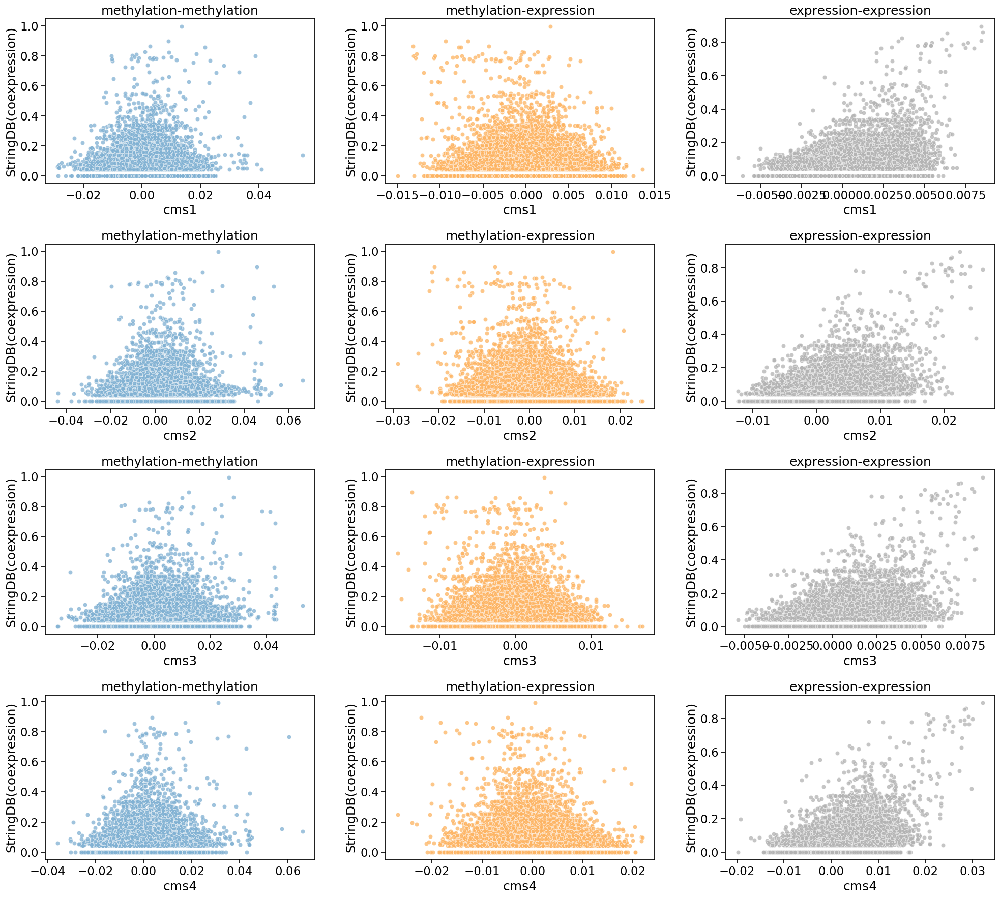

In [564]:
#f = draw_scatter_stringdb(df_dragon_stringdb.dropna(), x = ['cms1','cms2','cms3','cms4'], y = 'coexpression', savename = output_folder + 'dragon_stringdb_scatter_coexpression.pdf')
f = draw_scatter_stringdb(df_dragon_stringdb.dropna(), x = ['cms1','cms2','cms3','cms4'], y = 'coexpression', savename = output_folder + 'dragon_stringdb_scatter_coexpression.png')

In [560]:
df_dragon_stringdb.head()

,node1,node2,cms1,cms2,cms3,cms4,mean,abs_mean,var,node1_type,...,experimental,database,textmining,combined_score,gene1,gene2,edge_stringdb,type1,type2,edge_type
4380,AEBP1_expression,AEBP2_expression,-0.002230,-0.005097,-0.000889,-0.003470,-0.002922,0.002922,0.000003,expression,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,expression,expression,expression-expression
4381,AEBP1_expression,AHDC1_expression,0.002987,0.006608,0.002577,0.004927,0.004275,0.004275,0.000003,expression,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,expression,expression,expression-expression
4382,AEBP1_expression,AHR_expression,NaN,NaN,-0.001567,NaN,-0.001567,0.001567,NaN,expression,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,expression,expression,expression-expression
4383,AEBP1_expression,AKAP8L_expression,0.001190,0.005383,-0.000514,-0.000802,0.001314,0.001972,0.000008,expression,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,expression,expression,expression-expression
4384,AEBP1_expression,AKAP8_expression,0.000040,0.002520,-0.000470,0.000507,0.000649,0.000884,0.000002,expression,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,expression,expression,expression-expression


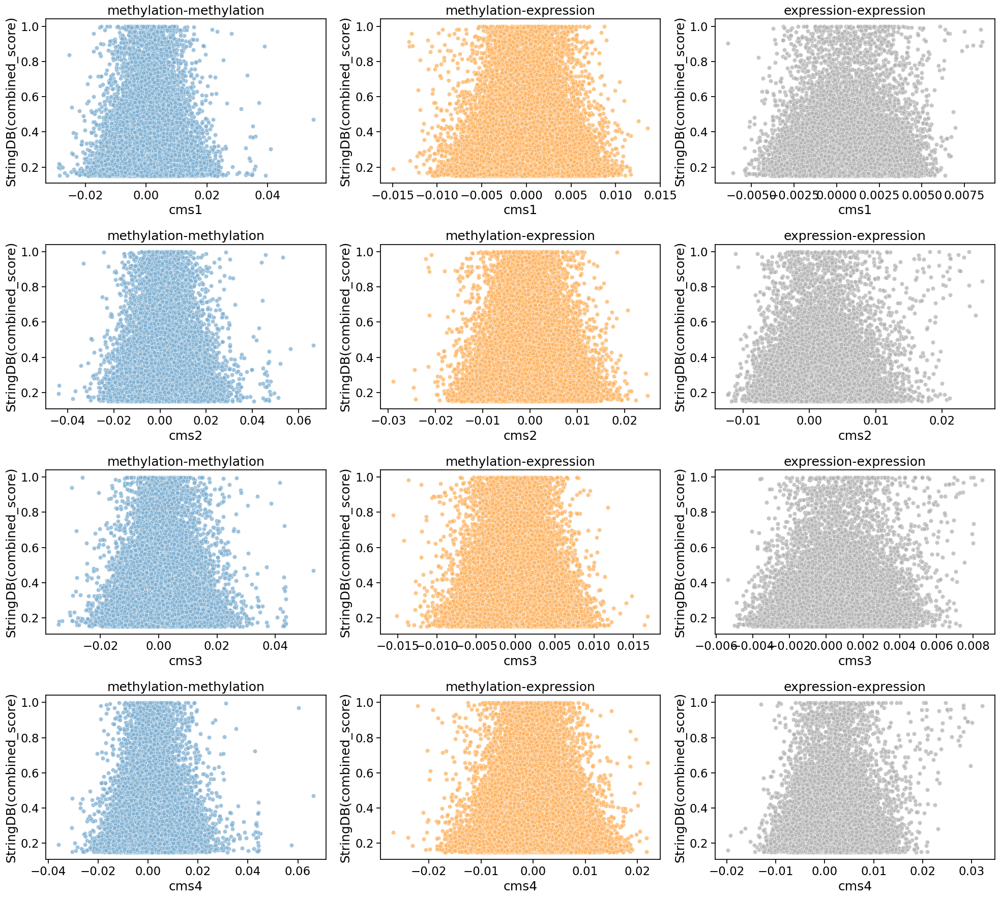

In [561]:
f = draw_scatter_stringdb(df_dragon_stringdb.dropna(), x = ['cms1','cms2','cms3','cms4'], y = 'combined_score', savename = None)